# <center>**STRUCTURING AND IMPORTING THE NECESSARY LIBRARIES**</center>

#### <u>**CONFIGURATION OF PACKAGES AND LIBRARY IMPORTATION**</u>

In [1]:
# Import necessary libraries
import pandas as pd                      # Data manipulation and analysis
import numpy as np                       # Numerical operations
import yfinance as yf                    # Downloading historical market data
import matplotlib.pyplot as plt          # Static and interactive visualizations
import seaborn as sns                    # Statistical data visualization
import plotly.express as px              # Interactive plots and dashboards
import statsmodels.api as sm             # Statistical modeling and hypothesis testing
import tensorflow as tf                  # Building and training neural networks
from sklearn.model_selection import train_test_split  # Splitting data into training and testing sets
from sklearn.ensemble import RandomForestRegressor    # Random Forest algorithm for machine learning
from tensorflow.keras.models import Sequential        # Neural network model
from tensorflow.keras.layers import LSTM, Dense, Dropout  # Layers for neural network
from scipy.optimize import minimize                   # Optimization functions
from flask import Flask, request, jsonify, render_template  # Web application framework
import os                               # Operating system
import glob 
import math                             # Mathematics
import quantstats as qs                 # Quantitative financial analysis
import cvxpy as cp                      # Convex optimization
from mpl_toolkits.mplot3d import Axes3D # 3D graphs

# Random Forest for Machine Learning
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import RandomForestRegressor

# XGBOOST for Machine Learning
from xgboost import XGBClassifier
from sklearn.model_selection import RandomizedSearchCV
import xgboost as xgb

# Neural Networks for Machine Learning
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam
from scikeras.wrappers import KerasClassifier

# Training and Testing 
from sklearn.model_selection import train_test_split

#Pipelines for Nested Cross-validation
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold

# Metrics Computation
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, auc, roc_auc_score, make_scorer, roc_curve
from sklearn.model_selection import cross_val_predict


# Matplotlib inline for static plots in notebooks
%matplotlib inline

# Pandas display options
pd.set_option('display.max_columns', 8)
pd.set_option('display.width', 1000)

# Extend Pandas with Quantstats
qs.extend_pandas()

# Matplotlib interactive charts
%matplotlib widget

# Seaborn styles
sns.set_theme()


#### <u>**READING HISTORICAL DATA FROM BLOOMBERG**</u>

In [2]:
import pandas as pd

# Define the path to the Excel file
file_name = 'portfolio.xlsx'

# Load all sheets from the Excel file into a dictionary where the key is the sheet name
sheets_dict = pd.read_excel(file_name, sheet_name=None)

# Initialize a list to hold DataFrames
df_list = []

# Iterate through the dictionary, process each sheet
for sheet_name, data in sheets_dict.items():
    # Add a column to each DataFrame to identify the ticker (sheet name)
    data['Ticker'] = sheet_name
    # Append the DataFrame to the list
    df_list.append(data)

# Concatenate all DataFrames into a single DataFrame
consolidated_data = pd.concat(df_list, ignore_index=True)

# Display the basic information about the combined DataFrame
print("Consolidated DataFrame Info:")
consolidated_data.info()

# Print the first few rows of the combined DataFrame
print("First few rows of the Consolidated DataFrame:")
print(consolidated_data.head(10))


Consolidated DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 8 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       22649 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Open Price  42063 non-null  float64       
 3   Low Price   42063 non-null  float64       
 4   High Price  42063 non-null  float64       
 5   Volume      41282 non-null  float64       
 6   Ticker      43625 non-null  object        
 7   Dates       20976 non-null  datetime64[ns]
dtypes: datetime64[ns](2), float64(5), object(1)
memory usage: 2.7+ MB
First few rows of the Consolidated DataFrame:
      Dates   Last Price  Open Price  Low Price  High Price       Volume          Ticker Dates
0 2021-01-01      132.69      134.08    131.720     134.740   99116586.0  AAPL US EQUITY   NaT
1 2021-01-04      129.41      133.52    126.760     133.612  143301887.0  AA

#### <u>**CHECKING FOR TICKERS**</u>

In [3]:
# Display unique tickers from the 'Ticker' column
unique_tickers = consolidated_data['Ticker'].unique()
print("Unique Tickers in the Consolidated DataFrame:")
print(unique_tickers)

Unique Tickers in the Consolidated DataFrame:
['AAPL US EQUITY' 'IBM US EQUITY' 'VOD LN EQUITY' 'MSFT US EQUITY' 'GOOGL'
 'AMZN US EQUITY' 'VRSN US EQUITY' 'INTU US EQUITY' 'ADBE US EQUITY'
 'TLSA US EQUITY' 'CSCO US EQUITY' 'PYPL US EQUITY' 'MDLZ US EQUITY'
 'GILD US EQUITY' 'MRNA US EQUITY' 'REGN US EQUITY' 'JPM US EQUITY'
 'GS US EQUITY' 'V US EQUITY' 'AXP US EQUITY' 'LLOY LN EQUITY'
 'STAN LN EQUITY' 'SDR LN EQUITY' 'HL-LN EQUITY' 'LSEG LN EQUITY'
 'BATS LN EQUITY' 'ULVR LN EQUITY' 'TSCO LN EQUITY' 'SBRY LN EQUITY'
 'MKS LN EQUITY' 'BA US EQUITY' 'DTE GY EQUITY' 'TTE FP EQUITY'
 'ABI BB EQUITY' 'NOKIA FP EQUITY' 'BNP FP EQUITY' 'SAN FP EQUITY'
 'ALV GR EQUITY' 'EXPN LN EQUITY' 'ITRK LN EQUITY' 'EZJ LN EQUITY'
 'AUTO LN EQUITY' 'SGRO LN EQUITY' 'UTG LN EQUITY' 'LAND LN EQUITY'
 'UKX INDEX' 'SPX INDEX' 'SX5E INDEX' 'NKY INDEX ' 'HSI INDEX'
 'BND US EQUITY' 'BNDX US EQUITY' 'GDBR2 INDEX' 'UKAB3YAC INDEX'
 'UKAB10BC INDEX' 'VTI US EQUITY']


#### <u>**CHECKING AND UPDATING THE DATAFRAME**</u>

In [4]:
# Check current column names to identify date columns
print("Current columns in DataFrame:")
print(consolidated_data.columns)

# If the date columns are still named differently or contain spaces, rename them appropriately
# Identify possible date columns
possible_date_columns = [col for col in consolidated_data.columns if 'date' in col.lower()]

print("Possible date columns identified:", possible_date_columns)

# Assuming we find 'Dates' and 'Dates ' as our relevant date columns
# Consolidate these columns
if 'Dates' in possible_date_columns and 'Dates ' in possible_date_columns:
    consolidated_data['Dates'] = consolidated_data['Dates'].fillna(consolidated_data['Dates '])
    consolidated_data.drop(columns=['Dates '], inplace=True, errors='ignore')

# Ensure 'Dates' column is in datetime format
consolidated_data['Dates'] = pd.to_datetime(consolidated_data['Dates'], errors='coerce')


# Verify the changes
print("Updated DataFrame Info:")
consolidated_data.info()
print(consolidated_data.head())

# Assuming 'cleaned_data' is your original DataFrame
consolidated_data_copy1 = consolidated_data.copy()

consolidated_data_copy1.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/consolidated_copy1.csv', index=False)
consolidated_data_copy1.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/consolidated_data_copy1.xlsx', index=False)


Current columns in DataFrame:
Index(['Dates ', 'Last Price', 'Open Price', 'Low Price', 'High Price', 'Volume', 'Ticker', 'Dates'], dtype='object')
Possible date columns identified: ['Dates ', 'Dates']
Updated DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Last Price  43625 non-null  float64       
 1   Open Price  42063 non-null  float64       
 2   Low Price   42063 non-null  float64       
 3   High Price  42063 non-null  float64       
 4   Volume      41282 non-null  float64       
 5   Ticker      43625 non-null  object        
 6   Dates       43625 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 2.3+ MB
   Last Price  Open Price  Low Price  High Price       Volume          Ticker      Dates
0      132.69      134.08    131.720     134.740   99116586.0  AAPL US EQU

#### <u>**CHECKING FOR NULL VALUES**</u>

In [5]:
# Check for null values in 'Dates' column
null_dates_count = consolidated_data['Dates'].isnull().sum()
print(f"Null Dates Count: {null_dates_count}")

# Display the min and max dates to ensure they cover the expected period
print("Date Range Start:", consolidated_data['Dates'].min())
print("Date Range End:", consolidated_data['Dates'].max())

# Check for null values in all columns
null_values = consolidated_data.isnull().sum()
print("Null values in each column:")
print(null_values)


Null Dates Count: 0
Date Range Start: 2021-01-01 00:00:00
Date Range End: 2023-12-29 00:00:00
Null values in each column:
Last Price       0
Open Price    1562
Low Price     1562
High Price    1562
Volume        2343
Ticker           0
Dates            0
dtype: int64


#### <u>**FIXING NULL VALUES AND SAVING DATAFRAME**</u>

In [6]:
import pandas as pd

# Assuming consolidated_data is already loaded

# Step 1: Keep only the relevant columns
relevant_columns = ['Dates', 'Last Price', 'Volume', 'Ticker']
consolidated_data = consolidated_data[relevant_columns]

# Step 2: Ensure 'Dates' is the first column (already done by selecting in the right order)

# Step 3: Handle missing values with forward fill
consolidated_data['Last Price'].fillna(method='ffill', inplace=True)
consolidated_data['Volume'].fillna(method='ffill', inplace=True)

# Optionally, if you prefer to use backward fill instead, use the following lines:
# consolidated_data['Last Price'].fillna(method='bfill', inplace=True)
# consolidated_data['Volume'].fillna(method='bfill', inplace=True)

# Check for any remaining missing values
print("Null values after filling:")
print(consolidated_data.isnull().sum())

# Step 4: Sort the DataFrame by 'Dates' and 'Ticker'
consolidated_data = consolidated_data.sort_values(by=['Dates', 'Ticker'])

# Step 5: Save the cleaned DataFrame to a new CSV file
cleaned_file_path = 'cleaned_portfolio_data.csv'
consolidated_data.to_csv(cleaned_file_path, index=False)

print(f"Cleaned data saved to {cleaned_file_path}")


Null values after filling:
Dates         0
Last Price    0
Volume        0
Ticker        0
dtype: int64
Cleaned data saved to cleaned_portfolio_data.csv


# <center>**DATA EXPLORATORY ANALYSIS**</center>

#### <u>**RELOAD CLEANED DATA**</u>

In [7]:
import pandas as pd

# Load the cleaned data from the CSV file
cleaned_data = pd.read_csv('cleaned_portfolio_data.csv')

# Convert the 'Dates' column to datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Display the first few rows to ensure data is loaded correctly
print("First few rows of the cleaned data:")
print(cleaned_data.head())

# Display basic information about the DataFrame
print("\nDataFrame Info:")
cleaned_data.info()

# Check for any remaining null values
print("\nNull values in each column:")
print(cleaned_data.isnull().sum())

# Assuming 'cleaned_data' is your original DataFrame
data_copy1_data_exploratory_analysis = cleaned_data.copy()

data_copy1_data_exploratory_analysis.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy1.csv', index=False)
data_copy1_data_exploratory_analysis.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/ata_copy1.xlsx', index=False)

First few rows of the cleaned data:
       Dates  Last Price      Volume          Ticker
0 2021-01-01     132.690  99116586.0  AAPL US EQUITY
1 2021-01-01      57.010    389502.0   ABI BB EQUITY
2 2021-01-01     500.120   1462236.0  ADBE US EQUITY
3 2021-01-01     200.700    545156.0   ALV GR EQUITY
4 2021-01-01     162.847  59144120.0  AMZN US EQUITY

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       43625 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Volume      43625 non-null  float64       
 3   Ticker      43625 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 1.3+ MB

Null values in each column:
Dates         0
Last Price    0
Volume        0
Ticker        0
dtype: int64


#### <u>**GENERATE SUMMARY STATISTICS FOR THE DATAFRAME**</u>

In [8]:
import pandas as pd

# Display basic information about the DataFrame
print("DataFrame Info:")
cleaned_data.info()

# Generate summary statistics for the numerical columns
print("\nSummary Statistics:")
cleaned_data.describe()

DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype         
---  ------      --------------  -----         
 0   Dates       43625 non-null  datetime64[ns]
 1   Last Price  43625 non-null  float64       
 2   Volume      43625 non-null  float64       
 3   Ticker      43625 non-null  object        
dtypes: datetime64[ns](1), float64(2), object(1)
memory usage: 1.3+ MB

Summary Statistics:


,Dates,Last Price,Volume
count,43625,43625.000000,4.362500e+04
mean,2022-07-01 19:11:34.253295104,1869.443771,9.767448e+07
min,2021-01-01 00:00:00,-0.781000,3.400000e+02
25%,2021-10-01 00:00:00,86.340000,1.740879e+06
50%,2022-07-01 00:00:00,225.270000,4.316974e+06
75%,2023-03-31 00:00:00,782.000000,1.494285e+07
max,2023-12-29 00:00:00,33753.330000,6.012760e+09
std,NaN,4967.734260,3.613598e+08


#### <u>**PLOT TIMESERIES GRAPH FOR SELECTED TICKERS**</u>

In [9]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['TLSA US EQUITY', 'STAN LN EQUITY', 'SAN FP EQUITY', 'ALV GR EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR DIFFERENT SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [10]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['AAPL US EQUITY', 'GOOGL', 'MSFT US EQUITY', 'AMZN US EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR US-ONLY SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [11]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Select a few tickers to plot
selected_tickers = ['ABI BB EQUITY', 'NOKIA FP EQUITY', 'BNP FP EQUITY', 'SAN FP EQUITY']

# Create a subplot with 2 rows, one for 'Last Price' and one for 'Volume', with minimal vertical spacing
fig = make_subplots(rows=2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.02,  # Reduced vertical spacing
                    subplot_titles=('Last Price', ''))  # Empty title for the second plot

# Add traces for 'Last Price'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Last Price'], 
                             mode='lines', name=f'{ticker} - Last Price'),
                  row=1, col=1)

# Add traces for 'Volume'
for ticker in selected_tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['Volume'], 
                             mode='lines', name=f'{ticker} - Volume', opacity=0.6),
                  row=2, col=1)

# Update layout
fig.update_layout(
    title='PLOT FOR EUROPE-ONLY SECURITIES FOR A PORTFOLIO BASED ON SELECTED TICKERS',
    height=800,
    width=1200,
    hovermode='x unified',
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    xaxis2=dict(
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis=dict(
        title='Last Price',
        showgrid=True,
        gridcolor='lightgray'
    ),
    yaxis2=dict(
        title='Volume',
        showgrid=True,
        gridcolor='lightgray'
    )
)

# Show the plot
fig.show()


In [12]:
import plotly.express as px

# Filter data for selected tickers
selected_tickers = ['AAPL US EQUITY', 'GOOGL', 'MSFT US EQUITY', 'AMZN US EQUITY']

# Create a histogram for the Last Price of selected tickers
fig = px.histogram(cleaned_data[cleaned_data['Ticker'].isin(selected_tickers)], 
                   x='Last Price', 
                   color='Ticker',
                   barmode='group',  # Group the histograms for clearer comparison
                   nbins=50,  # Number of bins can be adjusted depending on data spread
                   title='Distribution of Last Prices for Selected Tickers',
                   height=1000  # Increase the height of the graph
)

# Update layout for better visualization
fig.update_layout(
    xaxis_title="Last Price",
    yaxis_title="Count",
    plot_bgcolor='white',
    paper_bgcolor='white',
    legend_title_text='Ticker'
)

# Show the plot
fig.show()


In [13]:
import plotly.express as px

# Aggregate total trading volume by ticker
volume_by_ticker = cleaned_data.groupby('Ticker')['Volume'].sum().reset_index()

# Create a vertical bar chart for trading volume
fig = px.bar(volume_by_ticker, 
             x='Ticker', 
             y='Volume', 
             title='Total Trading Volume by Ticker',
             text='Volume')  # Optionally add volume numbers on top of each bar

# Update layout
fig.update_layout(
    xaxis_title="Ticker",
    yaxis_title="Total Volume",
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis={'categoryorder':'total descending'},  # Sort bars by descending order of volume
    xaxis_tickangle=-45,  # Rotate the tick labels for better visibility
    height=1000  # Increase the height of the graph
)

# Show the plot
fig.show()


In [14]:
# Pivot the data to have dates as rows and tickers as columns for Last Price
price_data = cleaned_data.pivot(index='Dates', columns='Ticker', values='Last Price')

# Calculate the correlation matrix for Last Prices across different tickers
correlation_matrix = price_data.corr()
print(correlation_matrix)


Ticker           AAPL US EQUITY  ABI BB EQUITY  ADBE US EQUITY  ALV GR EQUITY  ...  V US EQUITY  VOD LN EQUITY  VRSN US EQUITY  VTI US EQUITY
Ticker                                                                         ...                                                           
AAPL US EQUITY         1.000000      -0.119119        0.246234       0.354940  ...     0.462927      -0.635578        0.308940       0.445948
ABI BB EQUITY         -0.119119       1.000000        0.016201       0.555058  ...     0.392969       0.088137        0.333620       0.093638
ADBE US EQUITY         0.246234       0.016201        1.000000       0.339491  ...     0.541143       0.024776        0.588323       0.870284
ALV GR EQUITY          0.354940       0.555058        0.339491       1.000000  ...     0.741325      -0.338393        0.481203       0.455904
AMZN US EQUITY        -0.030614       0.046927        0.815589       0.128664  ...     0.246662       0.456101        0.518101       0.740302
AUTO L

In [15]:
import plotly.express as px

# Create a heatmap for the correlation matrix
fig = px.imshow(correlation_matrix,
                text_auto=True,  # Automatically add text on each cell with the correlation value
                labels=dict(x="Ticker", y="Ticker", color="Correlation"),
                title="Correlation Heatmap of Last Prices Across Tickers",
                aspect='auto')  # Adjust aspect ratio for better space utilization

# Update layout to make it more readable
fig.update_layout(
    plot_bgcolor='white',
    paper_bgcolor='white',
    xaxis=dict(tickmode='linear', tickangle=-45, tickfont=dict(size=10)),
    yaxis=dict(tickmode='linear', tickfont=dict(size=10)),
    autosize=True,
    height=1500,  # Increased height for better clarity
    width=1200,   # Matching width for square cells
    margin=dict(t=100, b=20, l=10, r=10)  # Adjust margins to fit labels
)

# Add a color scale for better visual interpretation
fig.update_traces(showscale=True)

# Show the plot
fig.show()


In [16]:
import plotly.graph_objects as go
from statsmodels.tsa.seasonal import seasonal_decompose

# Example tickers selection
tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Create a figure with subplots
fig = make_subplots(rows=len(tickers), cols=4, 
                    subplot_titles=[f"{ticker} - {comp}" for ticker in tickers for comp in ['Original', 'Trend', 'Seasonal', 'Residual']],
                    vertical_spacing=0.05)

# Loop through each ticker and perform decomposition
for i, ticker in enumerate(tickers, start=1):
    # Prepare data
    data = cleaned_data[cleaned_data['Ticker'] == ticker].set_index('Dates')['Last Price'].asfreq('B')
    data.fillna(method='ffill', inplace=True)  # Forward fill missing values
    
    # Decompose
    decomposition = seasonal_decompose(data, model='additive', period=30)  # Adjust the period based on data frequency

    # Add traces for each component
    fig.add_trace(go.Scatter(x=data.index, y=data, name=f'{ticker} Original'), row=i, col=1)
    fig.add_trace(go.Scatter(x=decomposition.trend.index, y=decomposition.trend, name=f'{ticker} Trend'), row=i, col=2)
    fig.add_trace(go.Scatter(x=decomposition.seasonal.index, y=decomposition.seasonal, name=f'{ticker} Seasonal'), row=i, col=3)
    fig.add_trace(go.Scatter(x=decomposition.resid.index, y=decomposition.resid, name=f'{ticker} Residual'), row=i, col=4)

# Update layout
fig.update_layout(height=1500, width=1200, title_text="Decomposition of Multiple Tickers by Region",
                  showlegend=False)

# Show the plot
fig.show()


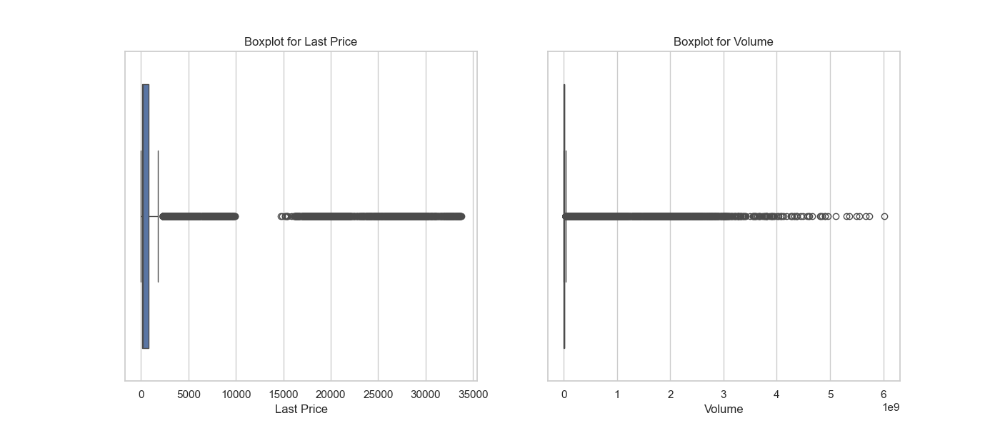

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set the aesthetic style of the plots
sns.set(style="whitegrid")

# Create subplots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Generate a boxplot for the 'Last Price'
sns.boxplot(ax=axes[0], data=cleaned_data, x='Last Price')
axes[0].set_title('Boxplot for Last Price')

# Generate a boxplot for the 'Volume'
sns.boxplot(ax=axes[1], data=cleaned_data, x='Volume')
axes[1].set_title('Boxplot for Volume')

plt.show()


In [18]:
from scipy import stats

# Calculate Z-scores for 'Last Price' and 'Volume'
cleaned_data['Z_score_Last_Price'] = stats.zscore(cleaned_data['Last Price'])
cleaned_data['Z_score_Volume'] = stats.zscore(cleaned_data['Volume'])

# Filter entries where the absolute Z-score is greater than 3
outliers_last_price = cleaned_data[cleaned_data['Z_score_Last_Price'].abs() > 3]
outliers_volume = cleaned_data[cleaned_data['Z_score_Volume'].abs() > 3]

print("Outliers in Last Price:")
print(outliers_last_price[['Dates', 'Last Price', 'Z_score_Last_Price']])

print("\nOutliers in Volume:")
print(outliers_volume[['Dates', 'Volume', 'Z_score_Volume']])


Outliers in Last Price:
           Dates  Last Price  Z_score_Last_Price
19    2021-01-01    27231.13            5.105341
30    2021-01-01    27444.17            5.148226
73    2021-01-04    27472.81            5.153991
85    2021-01-04    27258.38            5.110826
129   2021-01-05    27649.86            5.189632
...          ...         ...                 ...
43490 2023-12-27    33681.24            6.403757
43534 2023-12-28    17043.53            3.054564
43546 2023-12-28    33539.62            6.375248
43590 2023-12-29    17047.39            3.055341
43602 2023-12-29    33464.17            6.360060

[1524 rows x 3 columns]

Outliers in Volume:
           Dates        Volume  Z_score_Volume
19    2021-01-01  2.054705e+09        5.415802
73    2021-01-04  2.870443e+09        7.673240
129   2021-01-05  3.282490e+09        8.813520
185   2021-01-06  3.079383e+09        8.251449
213   2021-01-06  1.187304e+09        3.015393
...          ...           ...             ...
43369 2023-12

In [19]:
from statsmodels.tsa.stattools import adfuller

def adf_test(series, title=''):
    result = adfuller(series.dropna())  # Handling missing values if necessary
    print(f'\nADF Statistic for {title}: {result[0]}')
    print(f'p-value: {result[1]}')
    if result[1] < 0.05:
        print("Reject the null hypothesis. Data is stationary")
    else:
        print("Fail to reject the null hypothesis. Data is non-stationary")

# Apply ADF test to each ticker for 'Last Price' and 'Volume'
for ticker in tickers:
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    adf_test(ticker_data['Last Price'], f'{ticker} Last Price')
    adf_test(ticker_data['Volume'], f'{ticker} Volume')



ADF Statistic for AAPL US EQUITY Last Price: -1.561208110235126
p-value: 0.5030449663094321
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for AAPL US EQUITY Volume: -4.200179823990543
p-value: 0.0006584385360941034
Reject the null hypothesis. Data is stationary

ADF Statistic for HSI INDEX Last Price: -1.1100836527513145
p-value: 0.7110339541635611
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for HSI INDEX Volume: -7.675965724948505
p-value: 1.548586776958514e-11
Reject the null hypothesis. Data is stationary

ADF Statistic for NKY INDEX  Last Price: -1.676639495861908
p-value: 0.44318691301021634
Fail to reject the null hypothesis. Data is non-stationary

ADF Statistic for NKY INDEX  Volume: -5.9945443529549305
p-value: 1.7139709250533133e-07
Reject the null hypothesis. Data is stationary

ADF Statistic for GOOGL Last Price: -2.0836348022297284
p-value: 0.2511458411107097
Fail to reject the null hypothesis. Data is non-stationa

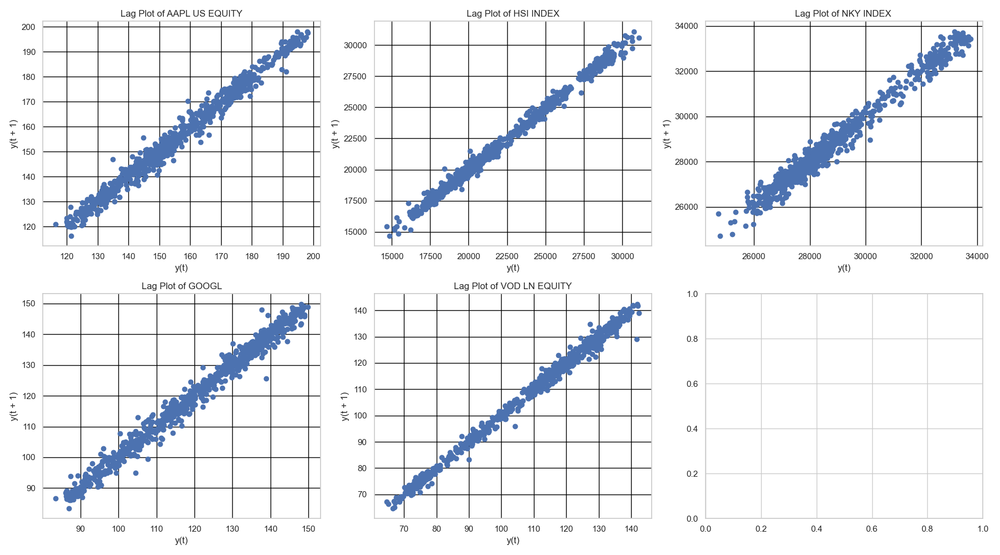

In [20]:
import pandas as pd
import matplotlib.pyplot as plt
from pandas.plotting import lag_plot

# Define the selected tickers for lag analysis
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Create a figure to hold the plots
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(18, 10))  # Adjusted for 5 tickers
axes = axes.flatten()  # Flatten the array for easier iteration

# Loop through the selected tickers and create lag plots
for i, ticker in enumerate(selected_tickers):
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    if not ticker_data.empty:
        lag_plot(ticker_data['Last Price'], ax=axes[i])
        axes[i].set_title(f'Lag Plot of {ticker}')
        axes[i].set_facecolor('white')  # Set the background color to white
        axes[i].grid(True, color='black')  # Set the grid color to black
    else:
        axes[i].set_visible(False)  # Hide axes if no data

# Adjust layout and display the plot
plt.tight_layout()
plt.show()


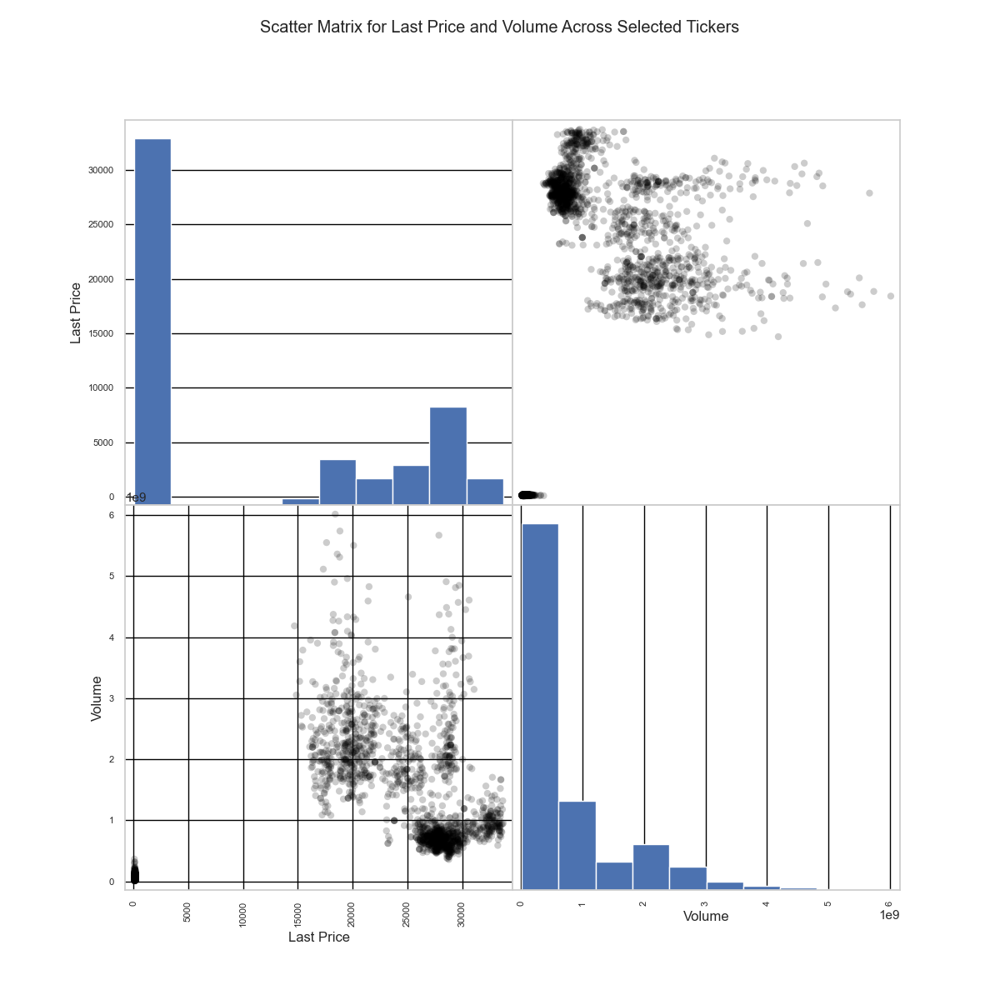

In [21]:
from pandas.plotting import scatter_matrix
import matplotlib.pyplot as plt

# Define the selected tickers for analysis
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Selecting data for the scatter matrix
features = ['Last Price', 'Volume']

# Filter data for selected tickers
filtered_data = cleaned_data[cleaned_data['Ticker'].isin(selected_tickers)]

# Generate the scatter matrix
scatter_matrix(filtered_data[features], alpha=0.2, figsize=(12, 12), diagonal='hist', marker='o', color='black', grid=True)

# Set background color to white
plt.gcf().patch.set_facecolor('white')

# Set grid color to black
for ax in plt.gcf().axes:
    ax.set_facecolor('white')
    ax.grid(color='black')

plt.suptitle('Scatter Matrix for Last Price and Volume Across Selected Tickers')
plt.show()


# <center>**MARKET TREND ANALYSIS USING Bi-LSTM MODEL**</center>

#### <u>**HANDLING OUTLIERS**</u>

In [22]:
def handle_outliers(data, feature):
    Q1 = data[feature].quantile(0.25)
    Q3 = data[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    
    # Cap the outliers
    data[feature] = np.where(data[feature] > upper_bound, upper_bound, data[feature])
    data[feature] = np.where(data[feature] < lower_bound, lower_bound, data[feature])
    return data

# Apply the function to each feature with potential outliers
for feature in ['Last Price', 'Volume']:
    cleaned_data = handle_outliers(cleaned_data, feature)


#### <u>**ENSURING STATIONARITY**</center>

In [23]:
def difference_series(data, interval=1):
    return data.diff(interval)

# Apply differencing if the ADF test fails
non_stationary_features = ['Last Price']  # Add all non-stationary features identified

for feature in non_stationary_features:
    cleaned_data[feature] = difference_series(cleaned_data[feature])
    # Drop NA caused by differencing
    cleaned_data = cleaned_data.dropna(subset=[feature])


#### <u>**CALCULATION FOR RSI**</center>

In [24]:
import pandas as pd

# Define the RSI calculation function
def calculate_rsi(data, window=14):
    delta = data['Last Price'].diff()
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    rsi = 100 - (100 / (1 + rs))
    return rsi

# Initialize a list to store the RSI values
rsi_list = []

# Calculate RSI for each ticker
for ticker in cleaned_data['Ticker'].unique():
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    rsi = calculate_rsi(ticker_data)
    rsi_list.extend(rsi)

# Add the RSI values to the cleaned_data DataFrame
cleaned_data['RSI'] = rsi_list

# Display the first few rows of the updated DataFrame
print(cleaned_data[['Dates', 'Last Price', 'Volume', 'Ticker', 'RSI']].head(20))


        Dates  Last Price      Volume          Ticker        RSI
1  2021-01-01     -75.680    389502.0   ABI BB EQUITY        NaN
2  2021-01-01     443.110   1462236.0  ADBE US EQUITY        NaN
3  2021-01-01    -299.420    545156.0   ALV GR EQUITY        NaN
4  2021-01-01     -37.853  34745816.5  AMZN US EQUITY        NaN
5  2021-01-01     433.153    781660.0  AUTO LN EQUITY        NaN
6  2021-01-01    -381.940  10487567.0    BA US EQUITY        NaN
7  2021-01-01    1611.430   1391542.0  BATS LN EQUITY        NaN
8  2021-01-01   -1737.300   6134914.0   BND US EQUITY        NaN
9  2021-01-01     -29.640   2864678.0  BNDX US EQUITY        NaN
10 2021-01-01     -15.445    827264.0   BNP FP EQUITY        NaN
11 2021-01-01       1.645  15105475.0  CSCO US EQUITY        NaN
12 2021-01-01     -29.795   3800644.0   DTE GY EQUITY        NaN
13 2021-01-01    1810.535    526596.0  EXPN LN EQUITY        NaN
14 2021-01-01   -1126.702   1167508.0   EZJ LN EQUITY  49.825784
15 2021-01-01    -699.488

#### <u>**CALCULATION FOR MACD**</center>

In [25]:
# Define the MACD calculation function
def calculate_macd(data, short_window=12, long_window=26, signal_window=9):
    short_ema = data['Last Price'].ewm(span=short_window, adjust=False).mean()
    long_ema = data['Last Price'].ewm(span=long_window, adjust=False).mean()
    macd = short_ema - long_ema
    signal = macd.ewm(span=signal_window, adjust=False).mean()
    macd_hist = macd - signal
    return macd, signal, macd_hist

# Initialize lists to store the MACD values
macd_list = []
signal_list = []
hist_list = []

# Calculate MACD for each ticker
for ticker in cleaned_data['Ticker'].unique():
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    macd, signal, hist = calculate_macd(ticker_data)
    macd_list.extend(macd)
    signal_list.extend(signal)
    hist_list.extend(hist)

# Add the MACD values to the cleaned_data DataFrame
cleaned_data['MACD'] = macd_list
cleaned_data['MACD_Signal'] = signal_list
cleaned_data['MACD_Hist'] = hist_list

# Display the first few rows of the updated DataFrame
print(cleaned_data[['Dates', 'Last Price', 'Volume', 'Ticker', 'MACD', 'MACD_Signal', 'MACD_Hist']].head(20))


        Dates  Last Price      Volume          Ticker      MACD  MACD_Signal  MACD_Hist
1  2021-01-01     -75.680    389502.0   ABI BB EQUITY  0.000000     0.000000   0.000000
2  2021-01-01     443.110   1462236.0  ADBE US EQUITY  0.277607     0.055521   0.222085
3  2021-01-01    -299.420    545156.0   ALV GR EQUITY  0.361913     0.116800   0.245113
4  2021-01-01     -37.853  34745816.5  AMZN US EQUITY  0.902473     0.273934   0.628539
5  2021-01-01     433.153    781660.0  AUTO LN EQUITY  0.941573     0.407462   0.534111
6  2021-01-01    -381.940  10487567.0    BA US EQUITY  0.828257     0.491621   0.336636
7  2021-01-01    1611.430   1391542.0  BATS LN EQUITY  0.875223     0.568342   0.306882
8  2021-01-01   -1737.300   6134914.0   BND US EQUITY  0.908428     0.636359   0.272069
9  2021-01-01     -29.640   2864678.0  BNDX US EQUITY  0.754974     0.660082   0.094892
10 2021-01-01     -15.445    827264.0   BNP FP EQUITY  0.822382     0.692542   0.129840
11 2021-01-01       1.645  15105

In [26]:
# Check for NaNs immediately after scaling and feature engineering
print("NaNs after scaling and feature engineering:")
print(cleaned_data.isna().sum())


NaNs after scaling and feature engineering:
Dates                    0
Last Price               0
Volume                   0
Ticker                   0
Z_score_Last_Price       0
Z_score_Volume           0
RSI                   2498
MACD                     0
MACD_Signal              0
MACD_Hist                0
dtype: int64


In [27]:
# Filling NaNs in 'RSI' with the median value
cleaned_data['RSI'].fillna(cleaned_data['RSI'].median(), inplace=True)

# Verify that NaNs are handled
print("NaNs after handling in RSI:")
print(cleaned_data['RSI'].isna().sum())

# Assuming 'cleaned_data' is your original DataFrame
data_copy2_macd_rsi = cleaned_data.copy()

data_copy2_macd_rsi.to_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy2.csv', index=False)
data_copy2_macd_rsi.to_excel('DIRECTORY.PORTFOLIO-OPTIMISATION/ata_copy2.xlsx', index=False)


NaNs after handling in RSI:
0


#### <u>**PLOT FOR RSI AND MACD**</center>

In [28]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Define the selected tickers for plotting
selected_tickers = ['AAPL US EQUITY', 'HSI INDEX', 'NKY INDEX ', 'GOOGL', 'VOD LN EQUITY']

# Define colors for the tickers
colors = ['blue', 'green', 'purple', 'orange', 'cyan']

# Create a subplot for each ticker with two rows: one for RSI and one for MACD
fig = make_subplots(rows=len(selected_tickers) * 2, cols=1, shared_xaxes=True, 
                    vertical_spacing=0.05, subplot_titles=[f'{ticker} RSI' for ticker in selected_tickers] + 
                                                      [f'{ticker} MACD' for ticker in selected_tickers])

for i, ticker in enumerate(selected_tickers):
    ticker_data = cleaned_data[cleaned_data['Ticker'] == ticker]
    
    # Plot RSI
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['RSI'], mode='lines', name=f'{ticker} RSI',
                             line=dict(color=colors[i])), row=i*2+1, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=[70]*len(ticker_data), mode='lines', name='Overbought (70)',
                             line=dict(color='red', dash='dash')), row=i*2+1, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=[30]*len(ticker_data), mode='lines', name='Oversold (30)',
                             line=dict(color='black', dash='dash')), row=i*2+1, col=1)

    # Plot MACD
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['MACD'], mode='lines', name=f'{ticker} MACD',
                             line=dict(color=colors[i])), row=i*2+2, col=1)
    fig.add_trace(go.Scatter(x=ticker_data['Dates'], y=ticker_data['MACD_Signal'], mode='lines', name=f'{ticker} MACD Signal',
                             line=dict(color='red')), row=i*2+2, col=1)
    fig.add_trace(go.Bar(x=ticker_data['Dates'], y=ticker_data['MACD_Hist'], name=f'{ticker} MACD Histogram',
                         marker=dict(color='green')), row=i*2+2, col=1)

# Update layout
for axis in fig.layout:
    if 'xaxis' in axis:
        fig.update_layout({axis: dict(showgrid=True, gridcolor='black')})
    if 'yaxis' in axis:
        fig.update_layout({axis: dict(showgrid=True, gridcolor='black')})

fig.update_layout(
    title='RSI and MACD for Selected Tickers',
    height=1800, width=1300,
    plot_bgcolor='white',
    paper_bgcolor='white',
    showlegend=True,
    legend=dict(x=1, y=1)
)

# Show the plot
fig.show()


# <center>**MACHINE LEARNING MODELING**</center>

#### <u>**DATA STANDARDIZATION**</center>

In [29]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Assuming 'cleaned_data' is your DataFrame and it includes a 'Dates' column
# Separate the date and ticker columns
date_ticker_columns = cleaned_data[['Dates', 'Ticker']]  # Keep dates and ticker in a separate DataFrame
features_data = cleaned_data.drop(columns=['Dates', 'Ticker'])  # Remove dates and ticker from the features data

# Define the features you want to scale
features = ['Volume', 'RSI', 'MACD', 'MACD_Signal', 'MACD_Hist']  # Example features
target = 'Last Price'  # The target column name

# Initialize the scaler
scaler = StandardScaler()

# Fit and transform the features, ensure these features exist in your DataFrame
if all(feature in features_data.columns for feature in features):
    features_data[features] = scaler.fit_transform(features_data[features])
else:
    missing = [feature for feature in features if feature not in features_data.columns]
    raise ValueError(f"Missing columns in the features data: {missing}")

# Concatenate the date and ticker columns back to the scaled features
cleaned_data = pd.concat([date_ticker_columns, features_data], axis=1)
print("'Ticker' column present after Step 1:", 'Ticker' in cleaned_data.columns)

# Splitting the data into training and testing sets (assuming 80% training and 20% testing)
train_size = int(len(features_data) * 0.8)
test_size = len(features_data) - train_size
train, test = features_data[0:train_size], features_data[train_size:len(features_data)]

# Further split into features and target
X_train = train.drop(columns=[target])
y_train = train[target]
X_test = test.drop(columns=[target])
y_test = test[target]

# Normalize the feature data
scaler_X = StandardScaler()
X_train_scaled = scaler_X.fit_transform(X_train)
X_test_scaled = scaler_X.transform(X_test)

# Normalize the target data
scaler_y = StandardScaler()
y_train_scaled = scaler_y.fit_transform(y_train.values.reshape(-1, 1)).flatten()
y_test_scaled = scaler_y.fit_transform(y_test.values.reshape(-1, 1)).flatten()


'Ticker' column present after Step 1: True


#### <u>**FEATURE ENGINEERING FOR BI-LSTM**</center>

In [30]:
import numpy as np
from sklearn.model_selection import train_test_split

def create_sequences(data, n_steps=60):
    X, y = [], []
    for i in range(len(data) - n_steps):
        seq_x, seq_y = data[i:i+n_steps, :-1], data[i + n_steps, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

# Assuming 'cleaned_data' has relevant features and target in the last column
data_array = cleaned_data.drop(columns=['Dates', 'Ticker']).values  # Exclude 'Dates' and 'Ticker'
X, y = create_sequences(data_array, n_steps=60)

# Now split the data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

print(f"X_train shape: {X_train.shape}")  # Should output: (number_of_samples, 60, number_of_features - 1)
print(f"y_train shape: {y_train.shape}")  # Should output: (number_of_samples,)


X_train shape: (34851, 60, 7)
y_train shape: (34851,)


#### <u>**LABEL ENCODING**</center>

In [31]:
from sklearn.preprocessing import OneHotEncoder

# Ensure 'Ticker' column is present
if 'Ticker' not in cleaned_data.columns:
    raise ValueError("Column 'Ticker' is missing from the DataFrame.")

# Initialize the OneHotEncoder
encoder = OneHotEncoder(sparse_output=False)

# Fit and transform the 'Ticker' column
ticker_encoded = encoder.fit_transform(cleaned_data[['Ticker']])

# Create a DataFrame with encoded columns
ticker_encoded_df = pd.DataFrame(ticker_encoded, columns=[f"Ticker_{i}" for i in range(ticker_encoded.shape[1])])

# Concatenate this DataFrame with the original cleaned_data
cleaned_data = pd.concat([cleaned_data.drop('Ticker', axis=1), ticker_encoded_df], axis=1)
print("Ticker column successfully encoded.")


Ticker column successfully encoded.


#### <u>**DEFINING A SIMPLE Bi-LSTM MODEL**</center>

In [32]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout

# Define the Bi-LSTM model
def create_bi_lstm_model():
    model = Sequential()
    model.add(Bidirectional(LSTM(50, return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Bidirectional(LSTM(50)))
    model.add(Dropout(0.2))
    model.add(Dense(1))  # Adjust the output dimensions if necessary based on your y_train shape
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Instantiate and compile the model
model = create_bi_lstm_model()

# Display model summary to verify its structure
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirection  (None, 60, 100)           23200     
 al)                                                             
                                                                 
 bidirectional_1 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout (Dropout)           (None, 100)               0         
                                                                 
 dense (Dense)               (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


#### <u>**TRAIN BI-LSTM MODEL**</center>

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_2 (Bidirecti  (None, 60, 100)           23200     
 onal)                                                           
                                                                 
 bidirectional_3 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout_1 (Dropout)         (None, 100)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/50
872/8

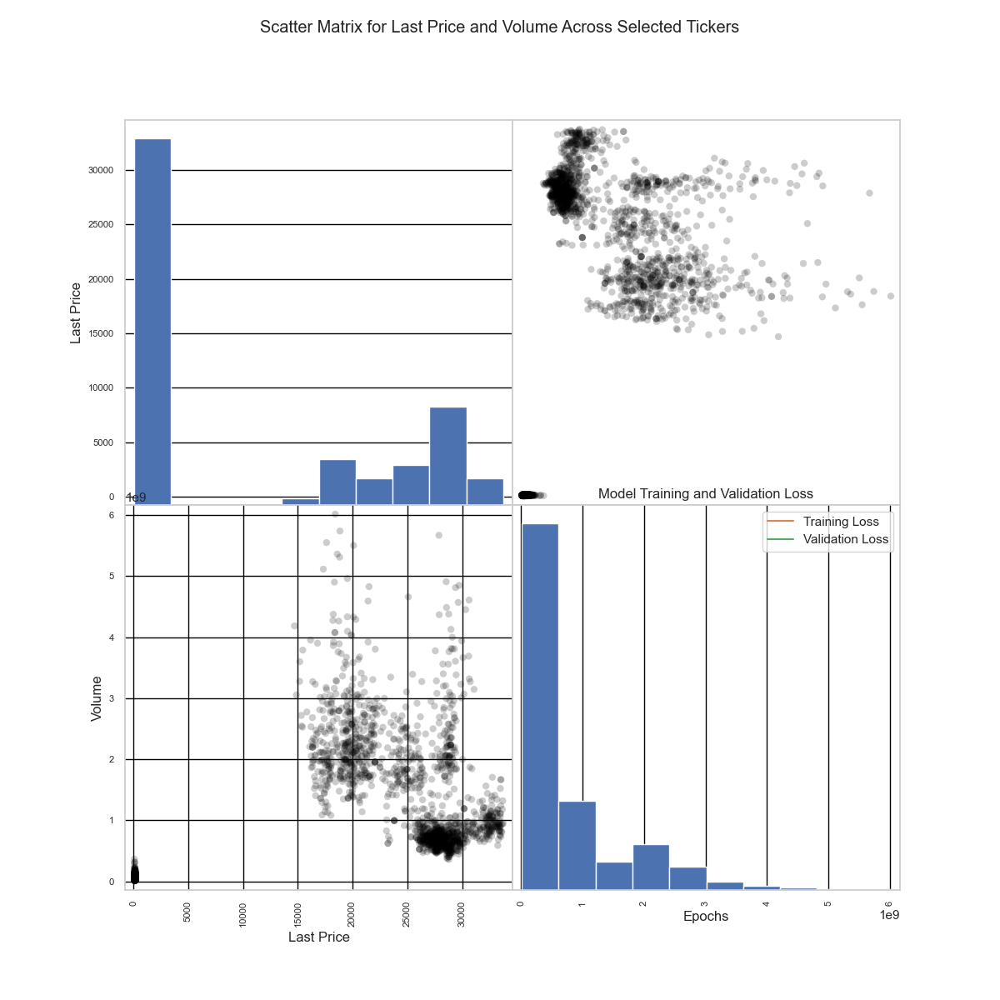

In [33]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout

# Define the model
def create_bi_lstm_model(input_shape):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True), input_shape=input_shape),
        Bidirectional(LSTM(50)),
        Dropout(0.2),
        Dense(1)  # Predicting the next value
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Assuming the third dimension is the number of features, e.g., 7
model = create_bi_lstm_model((60, 7))

# Model summary
model.summary()

# Fit the model
history = model.fit(X_train, y_train, epochs=50, batch_size=32, validation_split=0.2, verbose=1)

# Optionally, plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### <u>**BI-LSTM MODEL EVALUATION**</center>

In [34]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Generate predictions
y_pred = model.predict(X_test)

# Calculate MSE
mse = mean_squared_error(y_test, y_pred)
print("Mean Squared Error (MSE):", mse)

# Calculate RMSE
rmse = np.sqrt(mse)
print("Root Mean Squared Error (RMSE):", rmse)

# Calculate MAE
mae = mean_absolute_error(y_test, y_pred)
print("Mean Absolute Error (MAE):", mae)

# Calculate R-squared (R²)
r_squared = r2_score(y_test, y_pred)
print("R-squared (R²):", r_squared)


273/273 [==============================] - 2s 5ms/step
Mean Squared Error (MSE): 0.3102352964810515
Root Mean Squared Error (RMSE): 0.5569876986801877
Mean Absolute Error (MAE): 0.21612165371125913
R-squared (R²): 0.7027986585736175


#### <u>**PLOTTING THE LOSS CURVE**</center>

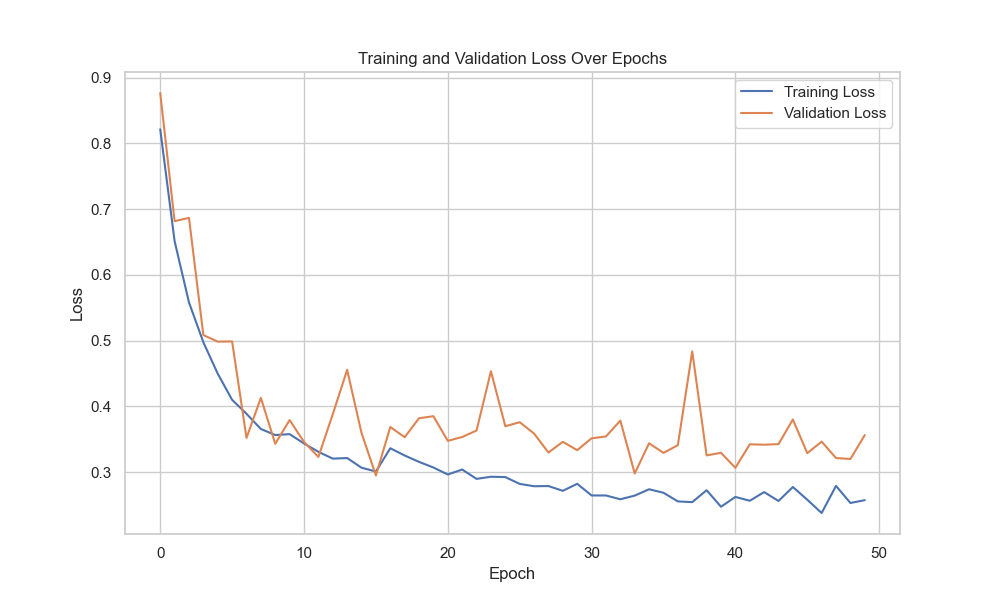

In [35]:
import matplotlib.pyplot as plt

# Assuming 'history' is the output from the model.fit() process
plt.figure(figsize=(10, 6))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)
plt.show()


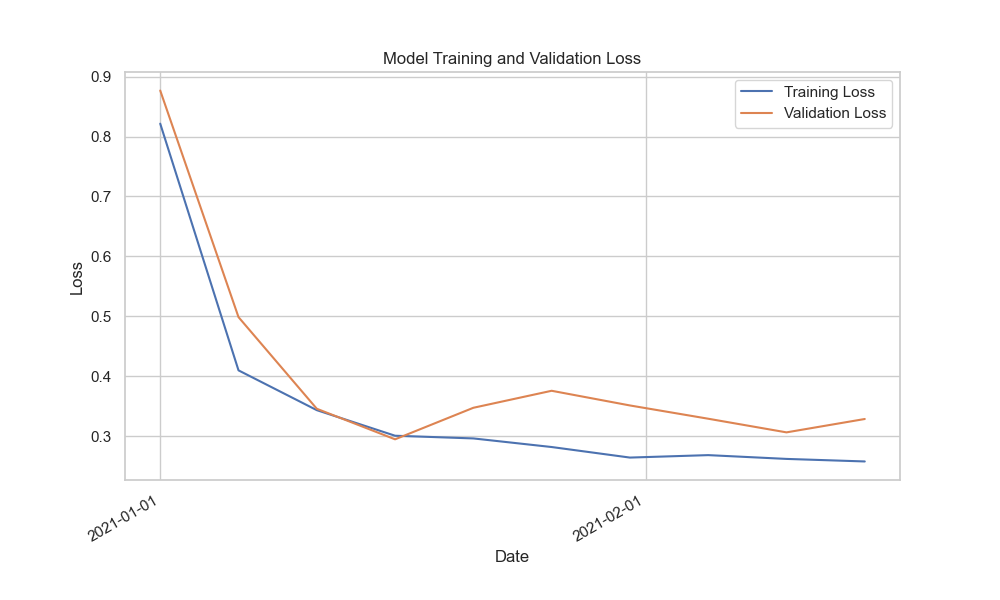

In [36]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for demonstration
date_index = pd.date_range(start='2021-01-01', periods=len(history.history['loss']), freq='D')

# Reduce the number of points to plot (e.g., take every 5th point)
reduced_indices = range(0, len(history.history['loss']), 5)

# Plot the training and validation loss with reduced points
plt.figure(figsize=(10, 6))
plt.plot(date_index[reduced_indices], [history.history['loss'][i] for i in reduced_indices], label='Training Loss')
plt.plot(date_index[reduced_indices], [history.history['val_loss'][i] for i in reduced_indices], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Date')
plt.ylabel('Loss')
plt.legend()
plt.gca().xaxis.set_major_locator(mdates.MonthLocator())  # Major ticks every month
plt.gca().xaxis.set_minor_locator(mdates.WeekdayLocator())  # Minor ticks every week
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))  # Format major ticks as dates
plt.gcf().autofmt_xdate()  # Auto format date labels
plt.show()


#### <u>**PLOTTING THE COMPARISON OF ACTUAL AND PREDICTED VALUES**</center>

273/273 [==============================] - 1s 5ms/step


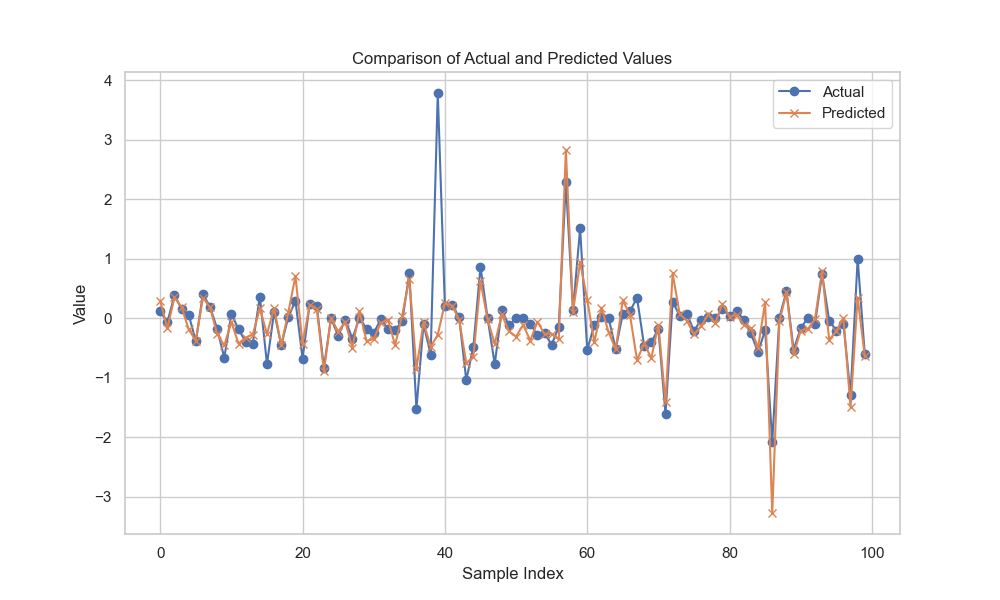

In [37]:
import matplotlib.pyplot as plt
import numpy as np

# Generate predictions for the test set
y_pred = model.predict(X_test)

# Plotting Prediction vs Actual for a subset of the data
plt.figure(figsize=(10, 6))
plt.plot(y_test[:100], label='Actual', marker='o')
plt.plot(y_pred[:100], label='Predicted', marker='x')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Sample Index')
plt.ylabel('Value')
plt.legend()
plt.grid(True)
plt.show()


#### <u>**PLOTTING THE COMPARISON BETWEEEN ACTUAL AND PREDICTED VALUES USING THE LINE PLOT**</center>

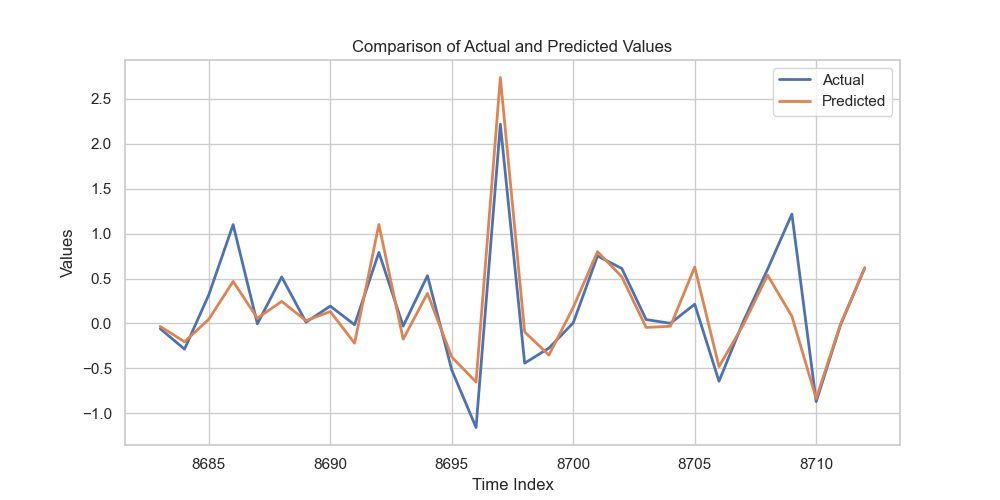

In [38]:
import matplotlib.pyplot as plt

# Select a specific subset for clearer visualization, e.g., 30 points
end = len(y_test)  # assuming y_test is defined and has enough entries
start = end - 30  # look at the last 30 points

plt.figure(figsize=(10, 5))
plt.plot(range(start, end), y_test[start:end], label='Actual', linestyle='-', linewidth=2)
plt.plot(range(start, end), y_pred[start:end], label='Predicted', linestyle='-', linewidth=2)
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Time Index')
plt.ylabel('Values')
plt.legend()
plt.grid(True)
plt.show()


273/273 [==============================] - 1s 5ms/step


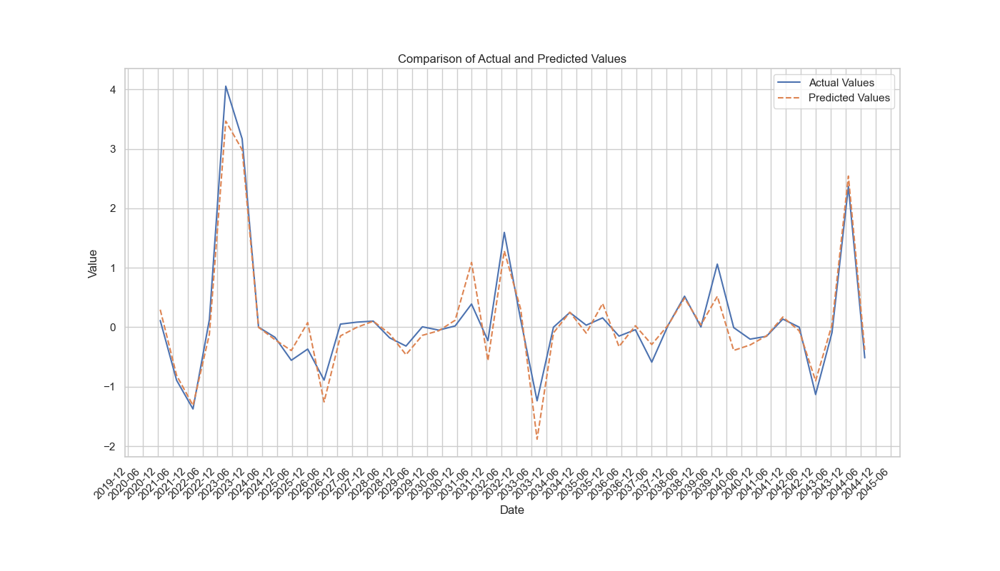

In [39]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for the test set
test_date_index = pd.date_range(start='2021-01-01', periods=len(y_test), freq='D')

# Reduce the number of points to plot (e.g., take every 200th point)
reduced_test_indices = range(0, len(y_test), 200)

# Predict values
y_pred = model.predict(X_test)

# Plot actual vs predicted values with reduced points
plt.figure(figsize=(14, 8))  # Increased figure size
plt.plot(test_date_index[reduced_test_indices], [y_test[i] for i in reduced_test_indices], label='Actual Values')
plt.plot(test_date_index[reduced_test_indices], [y_pred[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Set larger interval for major ticks and format the dates
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=6))  # Major ticks every 6 months
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(interval=1))  # Minor ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability
plt.show()


#### <u>**RESHAPING INPUT DATA FOR SECOND TRAINING**</center>

In [40]:
import numpy as np

# Reshape the input data to include the sequence length
sequence_length = 60
num_features = X_train_scaled.shape[1]

# Ensure the data length is divisible by sequence_length for simplicity
num_sequences_train = len(X_train_scaled) // sequence_length
num_sequences_test = len(X_test_scaled) // sequence_length

# Reshape the data
X_train_reshaped = np.reshape(X_train_scaled[:num_sequences_train * sequence_length], (num_sequences_train, sequence_length, num_features))
X_test_reshaped = np.reshape(X_test_scaled[:num_sequences_test * sequence_length], (num_sequences_test, sequence_length, num_features))

# Reshape the target data accordingly
y_train_reshaped = y_train_scaled[:num_sequences_train * sequence_length].reshape(num_sequences_train, sequence_length)[:, -1]
y_test_reshaped = y_test_scaled[:num_sequences_test * sequence_length].reshape(num_sequences_test, sequence_length)[:, -1]


#### <u>**ADDING REGULARIZATION AND EARLY STOPPING**</center>

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_4 (Bidirecti  (None, 60, 100)           23200     
 onal)                                                           
                                                                 
 bidirectional_5 (Bidirecti  (None, 100)               60400     
 onal)                                                           
                                                                 
 dropout_2 (Dropout)         (None, 100)               0         
                                                                 
 dense_2 (Dense)             (None, 1)                 101       
                                                                 
Total params: 83701 (326.96 KB)
Trainable params: 83701 (326.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________
Epoch 1/100
15/1

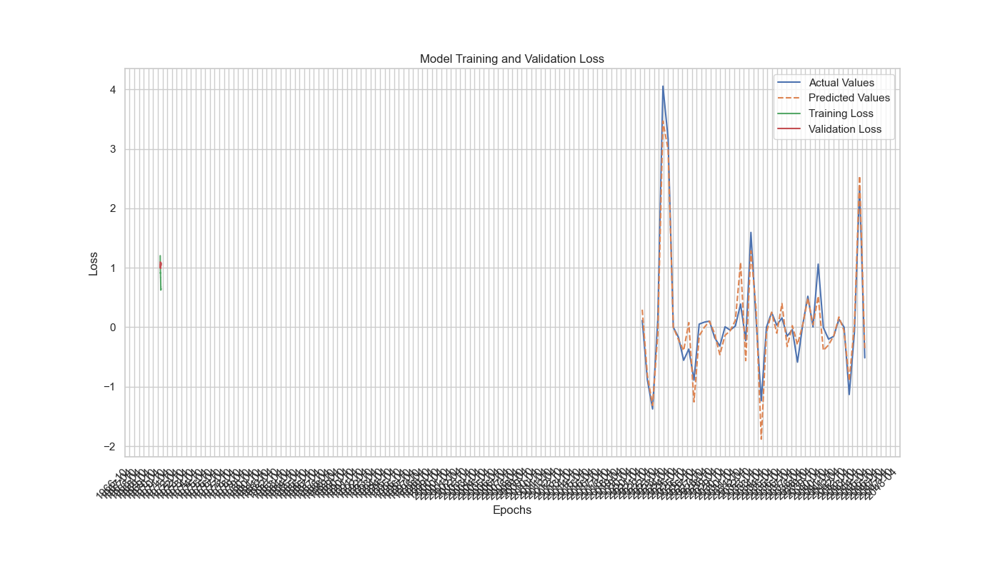

In [41]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping

# Define the model with regularization
def create_bi_lstm_model(input_shape):
    model = Sequential([
        Bidirectional(LSTM(50, return_sequences=True, kernel_regularizer=l2(0.001)), input_shape=input_shape),
        Bidirectional(LSTM(50, kernel_regularizer=l2(0.001))),
        Dropout(0.5),  # Increased dropout rate
        Dense(1)  # Predicting the next value
    ])
    model.compile(optimizer='adam', loss='mean_squared_error', metrics=['mae'])
    return model

# Assuming the third dimension is the number of features, e.g., 7
model = create_bi_lstm_model((sequence_length, num_features))

# Model summary
model.summary()

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Fit the model
history = model.fit(X_train_reshaped, y_train_reshaped, epochs=100, batch_size=32, validation_split=0.2, verbose=1, callbacks=[early_stopping])

# Optionally, plot the training and validation loss
import matplotlib.pyplot as plt

plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


#### <u>**MODEL EVALUATION SECOND TRAINING**</center>

In [42]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import numpy as np

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test_reshaped, y_test_reshaped)
print(f'Test Loss: {test_loss}')
print(f'Test MAE: {test_mae}')

# Predict values
y_pred_reshaped = model.predict(X_test_reshaped)

# Inverse transform the predictions and test data to original scale
y_test_original = scaler_y.inverse_transform(y_test_reshaped.reshape(-1, 1)).flatten()
y_pred_original = scaler_y.inverse_transform(y_pred_reshaped.reshape(-1, 1)).flatten()

# Calculate additional metrics
epsilon = 1e-10  # Small constant to avoid division by zero
mse = mean_squared_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)
mape = np.mean(np.abs((y_test_original - y_pred_original) / (y_test_original + epsilon))) * 100
explained_var = explained_variance_score(y_test_original, y_pred_original)

# Calculate SMAPE
smape = 100 / len(y_test_original) * np.sum(2 * np.abs(y_pred_original - y_test_original) / (np.abs(y_test_original) + np.abs(y_pred_original) + epsilon))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}')
print(f'Explained Variance Score: {explained_var}')
print(f'Symmetric Mean Absolute Percentage Error (SMAPE): {smape}')


5/5 [==============================] - 0s 6ms/step - loss: 1.0330 - mae: 0.6955
Test Loss: 1.0330249071121216
Test MAE: 0.6954964399337769
5/5 [==============================] - 0s 4ms/step
Mean Squared Error (MSE): 751426.317420242
Root Mean Squared Error (RMSE): 866.8484973859285
R-squared (R²): 0.02927282549252852
Mean Absolute Percentage Error (MAPE): 8180069468180.371
Explained Variance Score: 0.03251174624957898
Symmetric Mean Absolute Percentage Error (SMAPE): 152.89923811326793


#### <u>**PLOTTING MODEL EVALUATION FOR SECODN TRAINING**</center>

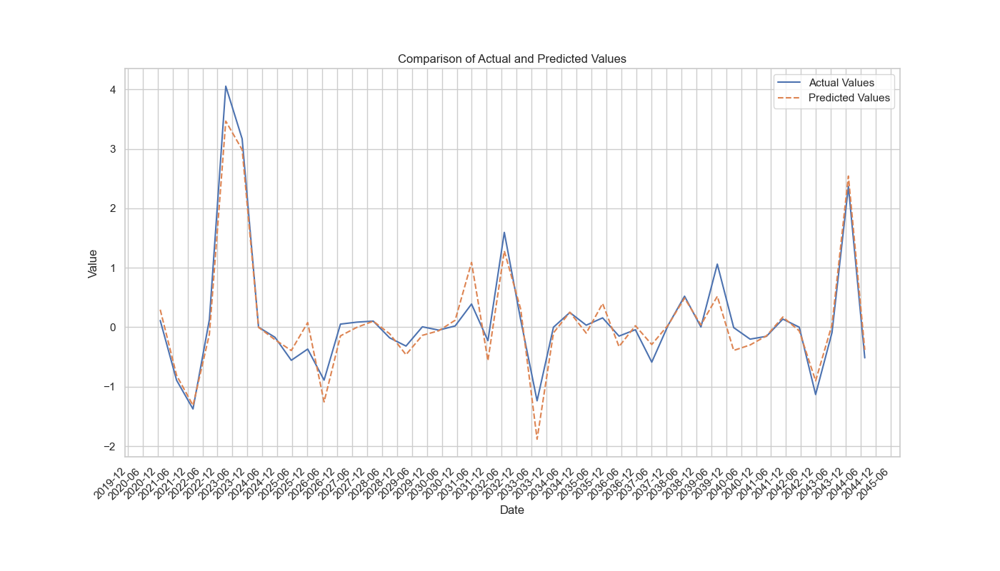

In [43]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import pandas as pd

# Example: Create a date range for the test set
test_date_index = pd.date_range(start='2021-01-01', periods=len(y_test), freq='D')

# Reduce the number of points to plot (e.g., take every 200th point)
reduced_test_indices = range(0, len(y_test), 200)

# Plot actual vs predicted values with reduced points for better readability
plt.figure(figsize=(14, 8))
plt.plot(test_date_index[reduced_test_indices], [y_test[i] for i in reduced_test_indices], label='Actual Values')
plt.plot(test_date_index[reduced_test_indices], [y_pred[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Manually set date ticks to avoid too many ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=6))  # Major ticks every 6 months
plt.gca().xaxis.set_minor_locator(mdates.MonthLocator(interval=1))  # Minor ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability
plt.show()


#### <u>**CUSTOM EARLY CALL BACK**</center>

In [44]:
from tensorflow.keras.callbacks import Callback

class CustomEarlyStopping(Callback):
    def __init__(self, patience=0, restore_best_weights=False):
        super(CustomEarlyStopping, self).__init__()
        self.patience = patience
        self.restore_best_weights = restore_best_weights
        self.best_weights = None

    def on_train_begin(self, logs=None):
        self.wait = 0
        self.stopped_epoch = 0
        self.best = float('inf')

    def on_epoch_end(self, epoch, logs=None):
        current = logs.get('val_loss')
        if current is None:
            return
        
        if np.less(current, self.best):
            self.best = current
            self.wait = 0
            if self.restore_best_weights:
                self.best_weights = self.model.get_weights()
        else:
            self.wait += 1
            if self.wait >= self.patience:
                self.stopped_epoch = epoch
                self.model.stop_training = True
                if self.restore_best_weights:
                    self.model.set_weights(self.best_weights)
                    
    def on_train_end(self, logs=None):
        if self.stopped_epoch > 0:
            print(f'Early stopping at epoch {self.stopped_epoch}')


#### <u>**DEFINING THE HYPERPARAMETER TUNNING**</center>

In [45]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, LSTM, Bidirectional, Dropout
from tensorflow.keras.regularizers import l2

def build_model(hp):
    model = Sequential()
    model.add(Bidirectional(LSTM(
        units=hp.Int('units1', min_value=32, max_value=128, step=32),
        return_sequences=True,
        kernel_regularizer=l2(hp.Choice('l2_1', [0.001, 0.01, 0.1]))),
        input_shape=(sequence_length, num_features)))
    model.add(Bidirectional(LSTM(
        units=hp.Int('units2', min_value=32, max_value=128, step=32),
        kernel_regularizer=l2(hp.Choice('l2_2', [0.001, 0.01, 0.1])))))
    model.add(Dropout(hp.Float('dropout', 0.2, 0.5, step=0.1)))
    model.add(Dense(1))
    
    model.compile(
        optimizer='adam',
        loss='mean_squared_error',
        metrics=['mae'])
    
    return model


#### <u>**CREATE TUNNER**</center>

In [46]:
tuner = kt.RandomSearch(
    build_model,
    objective='val_loss',
    max_trials=10,
    executions_per_trial=2,
    directory='my_dir',
    project_name='intro_to_kt')


Reloading Tuner from my_dir/intro_to_kt/tuner0.json


#### <u>**RUN TUNNER**</center>

In [47]:
tuner.search(X_train_reshaped, y_train_reshaped, epochs=100, validation_split=0.2)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

print(f"""
The optimal number of units in the first LSTM layer is {best_hps.get('units1')} and the second LSTM layer is {best_hps.get('units2')}.
The optimal regularization for the first LSTM layer is {best_hps.get('l2_1')} and the second LSTM layer is {best_hps.get('l2_2')}.
The optimal dropout rate is {best_hps.get('dropout')}.
""")



The optimal number of units in the first LSTM layer is 128 and the second LSTM layer is 96.
The optimal regularization for the first LSTM layer is 0.1 and the second LSTM layer is 0.01.
The optimal dropout rate is 0.2.



#### <u>**FINAL MODEL TRAINING WITH EARLY STOPPING**</center>

In [48]:
from tensorflow.keras.callbacks import EarlyStopping

# Build the model with the best hyperparameters
model = tuner.hypermodel.build(best_hps)

# Define early stopping
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

# Train the final model with early stopping
history = model.fit(X_train_reshaped, y_train_reshaped, epochs=100, validation_split=0.2, callbacks=[early_stopping])

# Evaluate the model on the test set
test_loss, test_mae = model.evaluate(X_test_reshaped, y_test_reshaped)
print(f'Test Loss: {test_loss}')
print(f'Test MAE: {test_mae}')


Epoch 1/100
15/15 [==============================] - 3s 79ms/step - loss: 8.3015 - mae: 0.6709 - val_loss: 6.6530 - val_mae: 0.6315
Epoch 2/100
15/15 [==============================] - 1s 55ms/step - loss: 5.6435 - mae: 0.6603 - val_loss: 4.5236 - val_mae: 0.6226
Epoch 3/100
15/15 [==============================] - 1s 57ms/step - loss: 3.8567 - mae: 0.6538 - val_loss: 3.1271 - val_mae: 0.6162
Epoch 4/100
15/15 [==============================] - 1s 55ms/step - loss: 2.7080 - mae: 0.6515 - val_loss: 2.2457 - val_mae: 0.6107
Epoch 5/100
15/15 [==============================] - 1s 63ms/step - loss: 1.9979 - mae: 0.6435 - val_loss: 1.7229 - val_mae: 0.6137
Epoch 6/100
15/15 [==============================] - 1s 56ms/step - loss: 1.5677 - mae: 0.6467 - val_loss: 1.3967 - val_mae: 0.6214
Epoch 7/100
15/15 [==============================] - 1s 57ms/step - loss: 1.3013 - mae: 0.6462 - val_loss: 1.2048 - val_mae: 0.6194
Epoch 8/100
15/15 [==============================] - 1s 57ms/step - loss: 1.

#### <u>**ADDITIONAL METRICS CALCULATION**</center>

In [49]:
from sklearn.metrics import mean_squared_error, r2_score, explained_variance_score
import numpy as np

# Predict values
y_pred_reshaped = model.predict(X_test_reshaped)

# Inverse transform the predictions and test data to original scale
y_test_original = scaler_y.inverse_transform(y_test_reshaped.reshape(-1, 1)).flatten()
y_pred_original = scaler_y.inverse_transform(y_pred_reshaped.reshape(-1, 1)).flatten()

# Calculate additional metrics
epsilon = 1e-10  # Small constant to avoid division by zero
mse = mean_squared_error(y_test_original, y_pred_original)
rmse = np.sqrt(mse)
r2 = r2_score(y_test_original, y_pred_original)
mape = np.mean(np.abs((y_test_original - y_pred_original) / (y_test_original + epsilon))) * 100
explained_var = explained_variance_score(y_test_original, y_pred_original)

# Calculate SMAPE
smape = 100 / len(y_test_original) * np.sum(2 * np.abs(y_pred_original - y_test_original) / (np.abs(y_test_original) + np.abs(y_pred_original) + epsilon))

print(f'Mean Squared Error (MSE): {mse}')
print(f'Root Mean Squared Error (RMSE): {rmse}')
print(f'R-squared (R²): {r2}')
print(f'Mean Absolute Percentage Error (MAPE): {mape}')
print(f'Explained Variance Score: {explained_var}')
print(f'Symmetric Mean Absolute Percentage Error (SMAPE): {smape}')


5/5 [==============================] - 0s 16ms/step
Mean Squared Error (MSE): 798473.2308268627
Root Mean Squared Error (RMSE): 893.5732934834516
R-squared (R²): -0.031504547167638064
Mean Absolute Percentage Error (MAPE): 6489245059746.326
Explained Variance Score: -0.007444949233028408
Symmetric Mean Absolute Percentage Error (SMAPE): 157.60525628011297


#### <u>**PLOTTING MODEL AFTER HYPERPARAMETER TUNNING**</center>

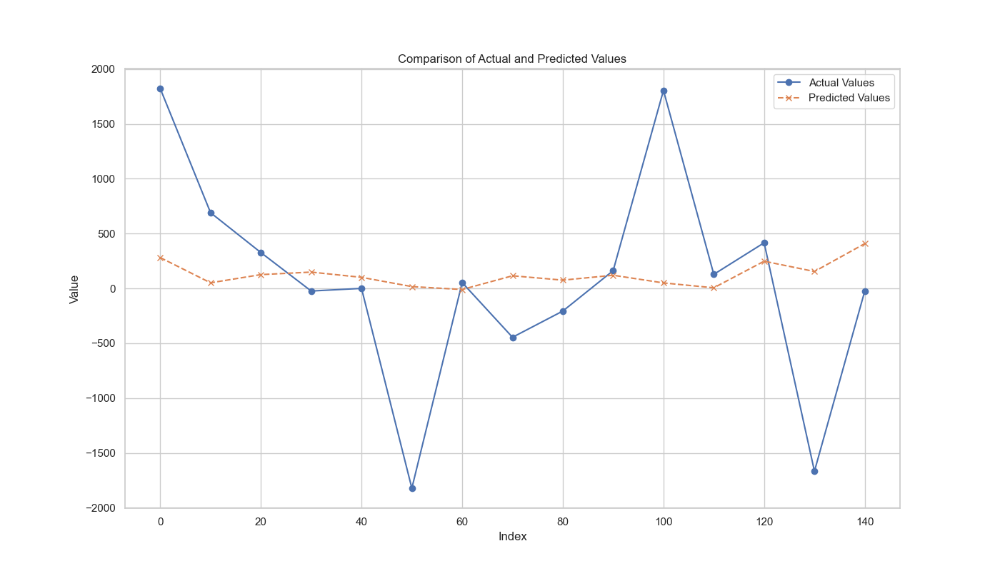

In [50]:
import matplotlib.pyplot as plt

# Reduce the number of points to plot (e.g., take every 10th point for clarity)
reduced_test_indices = range(0, len(y_test_original), 10)

# Plot actual vs predicted values with reduced points for better readability
plt.figure(figsize=(14, 8))
plt.plot(reduced_test_indices, [y_test_original[i] for i in reduced_test_indices], label='Actual Values', marker='o', linestyle='-')
plt.plot(reduced_test_indices, [y_pred_original[i] for i in reduced_test_indices], linestyle='--', label='Predicted Values', marker='x')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Index')
plt.ylabel('Value')
plt.legend()
plt.show()


Length of test_dates_aligned: 145
Length of y_test_original: 145
Length of y_pred_original: 145
Sample of test_dates_aligned: 35579   2023-06-13
35635   2023-06-14
35691   2023-06-15
35747   2023-06-16
35803   2023-06-19
35856   2023-06-20
35912   2023-06-21
35968   2023-06-22
36024   2023-06-23
36080   2023-06-26
Name: Dates, dtype: datetime64[ns]
Sample of y_test_original: [1822.47   -31.06   -80.22  1617.53    -6.46  -480.011  501.6   1403.13
 1780.16   203.53 ]
Sample of y_pred_original: [ 280.9689   -131.98192  -264.57303  -269.24738   -46.631294   40.066612
   98.93479   180.56885   142.15189    57.695175]


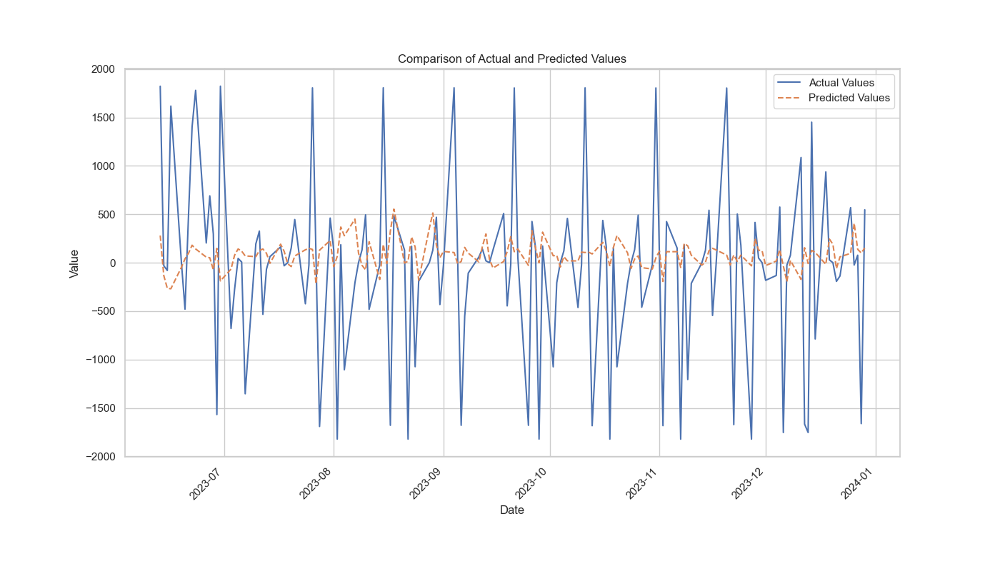

In [51]:
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.dates as mdates

# Ensure 'Dates' column in the original dataframe is in datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Extract the unique dates from the original dataframe
unique_dates = cleaned_data['Dates'].drop_duplicates()

# Extract the last test_set_length unique dates
test_set_length = len(y_test_original)
test_dates_aligned = unique_dates.iloc[-test_set_length:]

# Verify the lengths of all arrays
print(f'Length of test_dates_aligned: {len(test_dates_aligned)}')
print(f'Length of y_test_original: {len(y_test_original)}')
print(f'Length of y_pred_original: {len(y_pred_original)}')

# Print some samples from each to check if data aligns
print(f'Sample of test_dates_aligned: {test_dates_aligned[:10]}')
print(f'Sample of y_test_original: {y_test_original[:10]}')
print(f'Sample of y_pred_original: {y_pred_original[:10]}')

# Ensure that lengths match
assert len(test_dates_aligned) == len(y_test_original) == len(y_pred_original), "Lengths do not match!"

# Simplified plot to ensure it shows up
plt.figure(figsize=(14, 8))
plt.plot(test_dates_aligned, y_test_original, label='Actual Values')
plt.plot(test_dates_aligned, y_pred_original, label='Predicted Values', linestyle='--')
plt.title('Comparison of Actual and Predicted Values')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Format date ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Major ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability

# Show the plot
plt.show()


#### <u>**MONTHLY AVERAGE PLOT**</center>

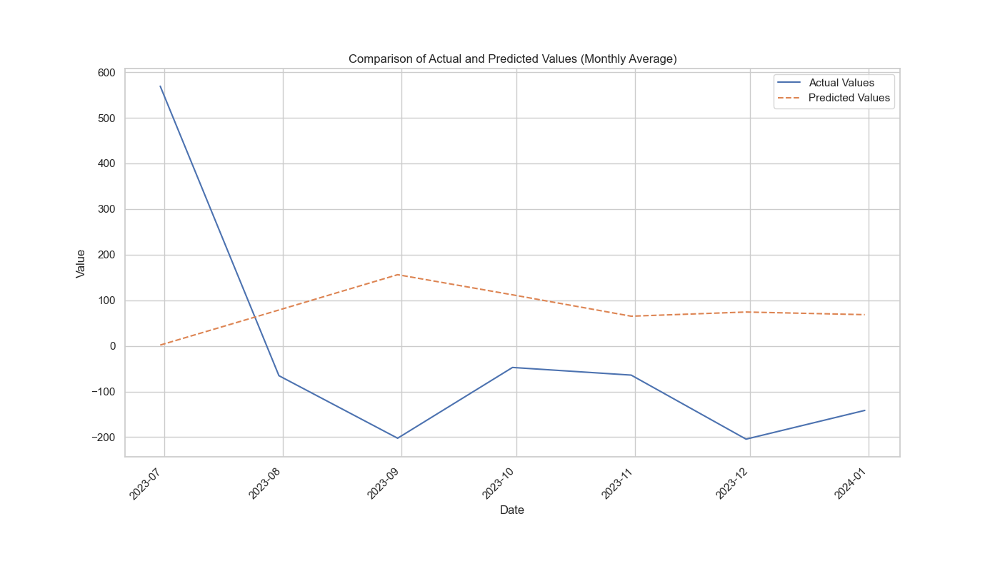

In [52]:
# Ensure 'Dates' column in the original dataframe is in datetime format
cleaned_data['Dates'] = pd.to_datetime(cleaned_data['Dates'])

# Extract the unique dates from the original dataframe
unique_dates = cleaned_data['Dates'].drop_duplicates()

# Extract the last test_set_length unique dates
test_set_length = len(y_test_original)
test_dates_aligned = unique_dates.iloc[-test_set_length:]

# Create a DataFrame to align dates with actual and predicted values
results_df = pd.DataFrame({
    'Date': test_dates_aligned,
    'Actual': y_test_original,
    'Predicted': y_pred_original
})

# Aggregate by month
results_df.set_index('Date', inplace=True)
monthly_results = results_df.resample('M').mean()

# Plotting the aggregated data
plt.figure(figsize=(14, 8))
plt.plot(monthly_results.index, monthly_results['Actual'], label='Actual Values')
plt.plot(monthly_results.index, monthly_results['Predicted'], label='Predicted Values', linestyle='--')
plt.title('Comparison of Actual and Predicted Values (Monthly Average)')
plt.xlabel('Date')
plt.ylabel('Value')
plt.legend()

# Format date ticks
plt.gca().xaxis.set_major_locator(mdates.MonthLocator(interval=1))  # Major ticks every month
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))  # Format major ticks as dates in Year-Month format
plt.gcf().autofmt_xdate(rotation=45)  # Rotate date labels for better readability

# Show the plot
plt.show()


#### <u>**CALCULATING AND PLOTTING RESIDUALS**</center>

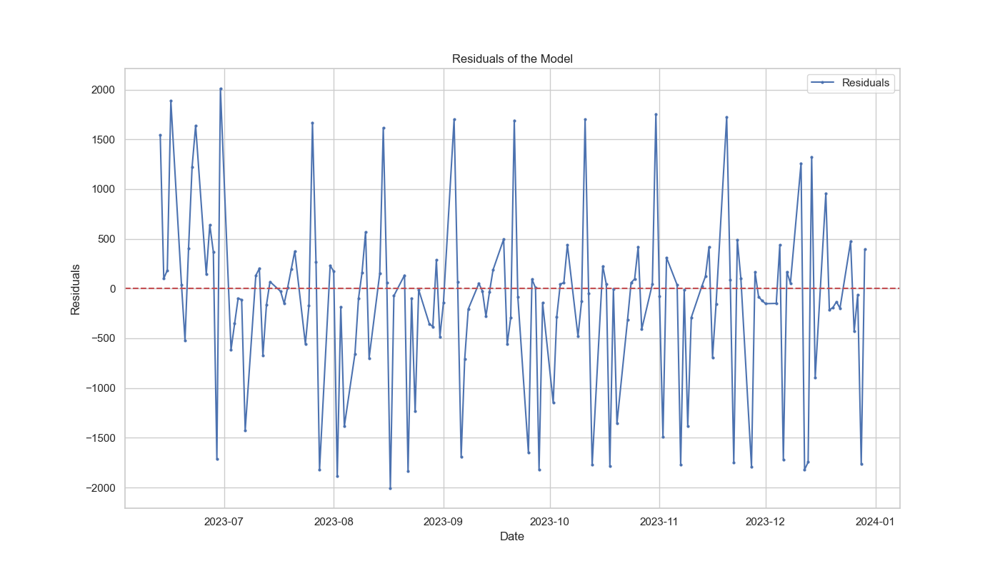

In [53]:
# Calculate residuals
residuals = y_test_original - y_pred_original

# Plot residuals
plt.figure(figsize=(14, 8))
plt.plot(test_dates_aligned, residuals, marker='o', linestyle='-', markersize=2, label='Residuals')
plt.axhline(y=0, color='r', linestyle='--')
plt.title('Residuals of the Model')
plt.xlabel('Date')
plt.ylabel('Residuals')
plt.legend()
plt.show()


#### <u>**RESIDUAL NORMALITY CHECKS**</center>

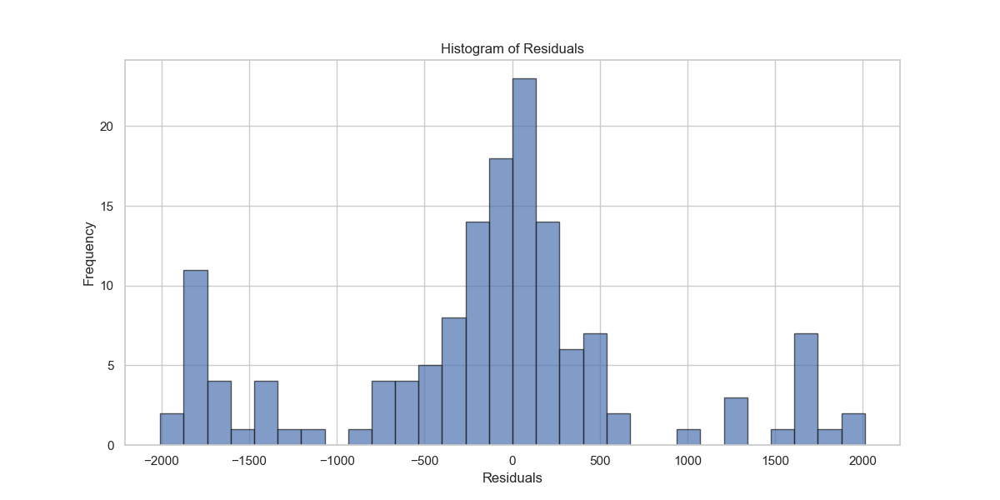

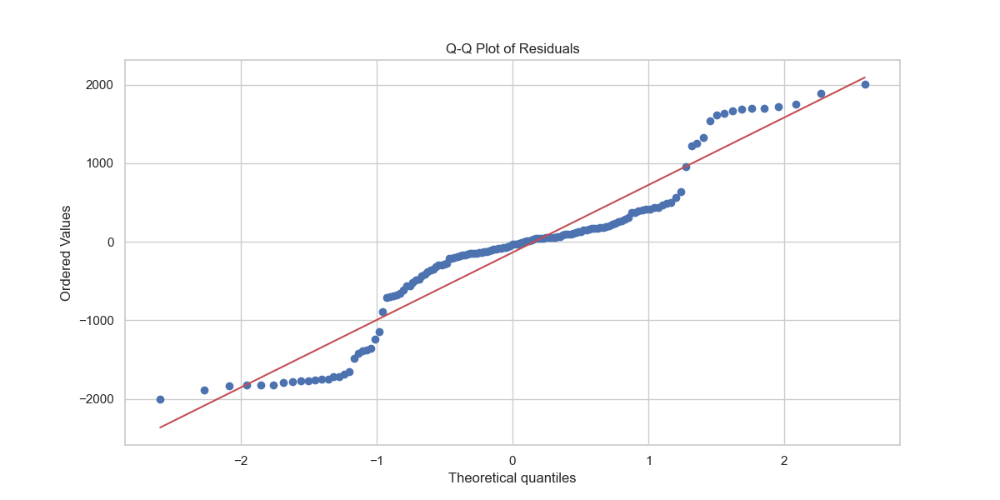

In [54]:
import scipy.stats as stats

# Plotting the histogram of residuals
plt.figure(figsize=(12, 6))
plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
plt.title('Histogram of Residuals')
plt.xlabel('Residuals')
plt.ylabel('Frequency')
plt.show()

# Plotting the Q-Q plot of residuals
plt.figure(figsize=(12, 6))
stats.probplot(residuals, dist="norm", plot=plt)
plt.title('Q-Q Plot of Residuals')
plt.show()


#### <u>**AUTO CORRELATION CHECKS**</center>

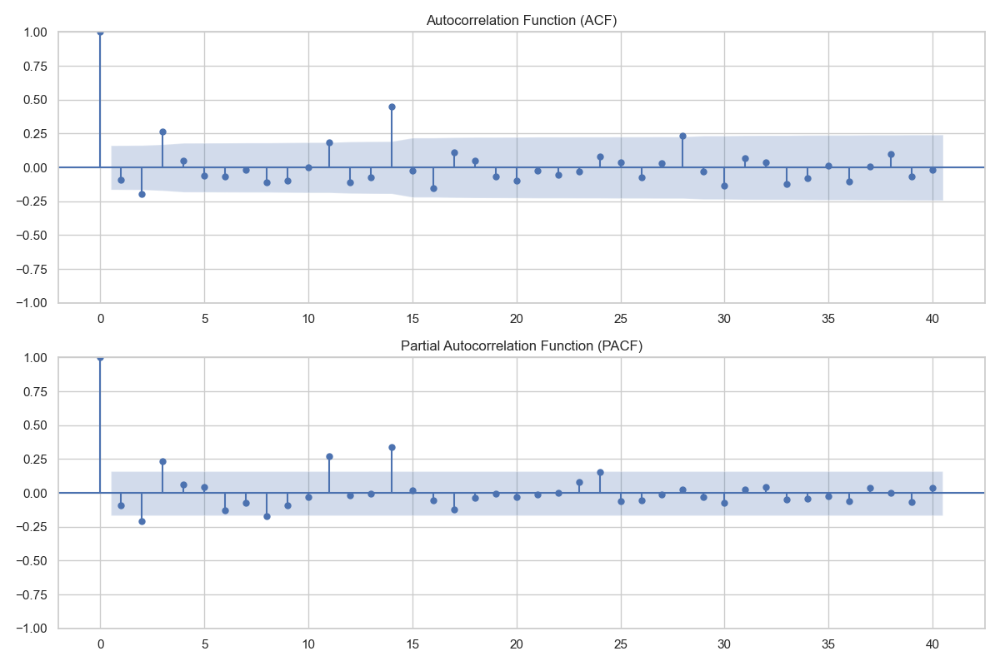

In [55]:
import statsmodels.api as sm
import matplotlib.pyplot as plt

# Plot ACF
fig, ax = plt.subplots(2, 1, figsize=(12, 8))

# Autocorrelation function
sm.graphics.tsa.plot_acf(residuals, lags=40, ax=ax[0])
ax[0].set_title('Autocorrelation Function (ACF)')

# Partial Autocorrelation function
sm.graphics.tsa.plot_pacf(residuals, lags=40, ax=ax[1])
ax[1].set_title('Partial Autocorrelation Function (PACF)')

plt.tight_layout()
plt.show()


#### <u>**SAVE THE MODEL**</center>

In [56]:
# Save the entire model in Keras format
model.save('bi_lstm_model.keras')

#### <u>**DOCUMENTATION AND REPORTING**</center>

# <center>**RISK ASSESSMENT USING RANDOM FOREST**</center>

#### <u>**LOAD SAVED DATA**</u>

In [57]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
# Assuming the dataset is saved as 'cleaned_data.csv' after data cleaning
risk_data = pd.read_csv('DIRECTORY.PORTFOLIO-OPTIMISATION/data_copy1.csv')

# Display the basic information about the combined DataFrame
print("Risk DataFrame Info:")
risk_data.info()

# Display the first few rows of the cleaned dataset
print(risk_data.head(43625))


Risk DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 43625 entries, 0 to 43624
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Dates       43625 non-null  object 
 1   Last Price  43625 non-null  float64
 2   Volume      43625 non-null  float64
 3   Ticker      43625 non-null  object 
dtypes: float64(2), object(2)
memory usage: 1.3+ MB
            Dates  Last Price      Volume          Ticker
0      2021-01-01     132.690  99116586.0  AAPL US EQUITY
1      2021-01-01      57.010    389502.0   ABI BB EQUITY
2      2021-01-01     500.120   1462236.0  ADBE US EQUITY
3      2021-01-01     200.700    545156.0   ALV GR EQUITY
4      2021-01-01     162.847  59144120.0  AMZN US EQUITY
...           ...         ...         ...             ...
43620  2023-12-29    1044.000    201361.0   UTG LN EQUITY
43621  2023-12-29     260.350   4074872.0     V US EQUITY
43622  2023-12-29      68.560  12193653.0   VOD LN 

#### <u>**CALCULATING HISTORICAL COVARIANCE**</u>

In [58]:
# Ensure 'Dates' column is in datetime format
risk_data['Dates'] = pd.to_datetime(risk_data['Dates'])

# Sort the DataFrame by date and ticker
risk_data = risk_data.sort_values(['Ticker', 'Dates'])

# Calculate daily returns
risk_data['Return'] = risk_data.groupby('Ticker')['Last Price'].pct_change()

# Drop rows with NaN returns which occur due to the pct_change()
risk_data = risk_data.dropna()

risk_data.head()


,Dates,Last Price,Volume,Ticker,Return
52,2021-01-04,129.41,143301887.0,AAPL US EQUITY,-0.024719
108,2021-01-05,131.01,97664898.0,AAPL US EQUITY,0.012364
164,2021-01-06,126.60,155087970.0,AAPL US EQUITY,-0.033662
220,2021-01-07,130.92,109578157.0,AAPL US EQUITY,0.034123
276,2021-01-08,132.05,105158245.0,AAPL US EQUITY,0.008631


#### <u>**PIVOT THE DATAFRAME TO CREATE A RETURN MATRIX**</u>

In [59]:
# Pivot the DataFrame to get a return matrix
return_matrix = risk_data.pivot(index='Dates', columns='Ticker', values='Return')

# Drop rows with NaN values (optional, based on your dataset)
return_matrix = return_matrix.dropna()

return_matrix.head()


Ticker,AAPL US EQUITY,ABI BB EQUITY,ADBE US EQUITY,ALV GR EQUITY,...,V US EQUITY,VOD LN EQUITY,VRSN US EQUITY,VTI US EQUITY
Dates,,,,,,,,,
2021-01-05,0.012364,-0.000524,0.000721,-0.005940,...,-0.014925,0.006309,-0.033149,0.008078
2021-01-06,-0.033662,0.027807,-0.039902,0.039704,...,-0.008811,0.041151,-0.033850,0.008996
2021-01-07,0.034123,-0.006296,0.024512,0.001218,...,0.005597,0.012506,0.002456,0.016038
2021-01-08,0.008631,-0.009247,0.015406,0.001459,...,0.007670,-0.020738,0.012200,0.004841
2021-01-11,-0.023249,-0.021604,-0.022387,-0.010930,...,-0.011882,-0.001090,-0.016252,-0.005972


#### <u>**CALCULATE THE COVARIANCE MATRIX**</u> 

In [60]:
# Calculate the covariance matrix
cov_matrix = return_matrix.cov()

print(cov_matrix)

Ticker           AAPL US EQUITY  ABI BB EQUITY  ADBE US EQUITY  ALV GR EQUITY  ...  V US EQUITY  VOD LN EQUITY  VRSN US EQUITY  VTI US EQUITY
Ticker                                                                         ...                                                           
AAPL US EQUITY         0.000306   3.986343e-05        0.000257   6.057154e-05  ...     0.000149   2.082085e-05    1.644347e-04       0.000159
ABI BB EQUITY          0.000040   2.381336e-04        0.000026   7.885488e-05  ...     0.000057   6.320216e-05    2.404172e-05       0.000050
ADBE US EQUITY         0.000257   2.625813e-05        0.000521   7.265566e-05  ...     0.000179  -1.182172e-05    2.222963e-04       0.000188
ALV GR EQUITY          0.000061   7.885488e-05        0.000073   1.541166e-04  ...     0.000078   5.334392e-05    4.360316e-05       0.000065
AMZN US EQUITY         0.000252   4.802467e-05        0.000324   7.777838e-05  ...     0.000158   2.774896e-05    1.978783e-04       0.000194
AUTO L

#### <u>**CALCULATE MEAN AND RETURN VOLATILITY**</u> 

In [61]:
# Calculate mean return and volatility (standard deviation of returns) for each asset
features = risk_data.groupby('Ticker')['Return'].agg(['mean', 'std']).reset_index()
features.columns = ['Ticker', 'Mean Return', 'Volatility']

# Verify the features DataFrame
print(features.head())

           Ticker  Mean Return  Volatility
0  AAPL US EQUITY     0.000625    0.017217
1   ABI BB EQUITY     0.000148    0.015334
2  ADBE US EQUITY     0.000479    0.022350
3   ALV GR EQUITY     0.000316    0.012300
4  AMZN US EQUITY     0.000179    0.023143


#### <u>**MERGE THE MEAN AND RETURN VOLATILITY WITH RISK DATA**</u> 

In [62]:
# Merge with the original risk_data to get other features if needed
merged_data = risk_data.merge(features, on='Ticker', how='left')

# Verify the merged data
print(merged_data.head())
# Assuming 'cleaned_data' is your original DataFrame

print("merged_data has been saved to 'merged_data.csv'")


       Dates  Last Price       Volume          Ticker    Return  Mean Return  Volatility
0 2021-01-04      129.41  143301887.0  AAPL US EQUITY -0.024719     0.000625    0.017217
1 2021-01-05      131.01   97664898.0  AAPL US EQUITY  0.012364     0.000625    0.017217
2 2021-01-06      126.60  155087970.0  AAPL US EQUITY -0.033662     0.000625    0.017217
3 2021-01-07      130.92  109578157.0  AAPL US EQUITY  0.034123     0.000625    0.017217
4 2021-01-08      132.05  105158245.0  AAPL US EQUITY  0.008631     0.000625    0.017217
merged_data has been saved to 'merged_data.csv'


#### <u>**DEFINE FEATURES AND TARGET VARIABLES**</u> 

In [63]:
# Define the target variable (e.g., risk measure)
# For simplicity, let's assume the risk measure is volatility
target = merged_data['Volatility']

# Select features for the model
# Drop any columns not needed for modeling, ensure 'Dates' and 'Ticker' are not included
X = merged_data.drop(columns=['Dates', 'Ticker', 'Volatility', 'Return'])
y = target

# Ensure no missing values
X.fillna(0, inplace=True)
y.fillna(0, inplace=True)

# Verify the features and target
print(X.head())
print(y.head())


   Last Price       Volume  Mean Return
0      129.41  143301887.0     0.000625
1      131.01   97664898.0     0.000625
2      126.60  155087970.0     0.000625
3      130.92  109578157.0     0.000625
4      132.05  105158245.0     0.000625
0    0.017217
1    0.017217
2    0.017217
3    0.017217
4    0.017217
Name: Volatility, dtype: float64


#### <u>**TRAIN-TEST SPLIT**</u> 

In [64]:
from sklearn.model_selection import train_test_split

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


#### <u>**TRAINING RANDOM FOREST MODEL**</u> 

In [65]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the Random Forest model
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

# The model has now been trained
print("Model training complete.")

Model training complete.


#### <u>**MODEL EVALUATION**</u> 

In [66]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

# Predict on the test set
y_pred = rf_model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = np.mean(np.abs((y_test - y_pred) / y_test)) * 100

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R²): {r2}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")


Mean Squared Error (MSE): 7.764371872404681e-09
R-squared (R²): 0.999999786446794
Mean Absolute Error (MAE): 2.3663102348480314e-06
Mean Absolute Percentage Error (MAPE): 0.017041384401949675


#### <u>**FEATURE IMPORTANCE**</u> 

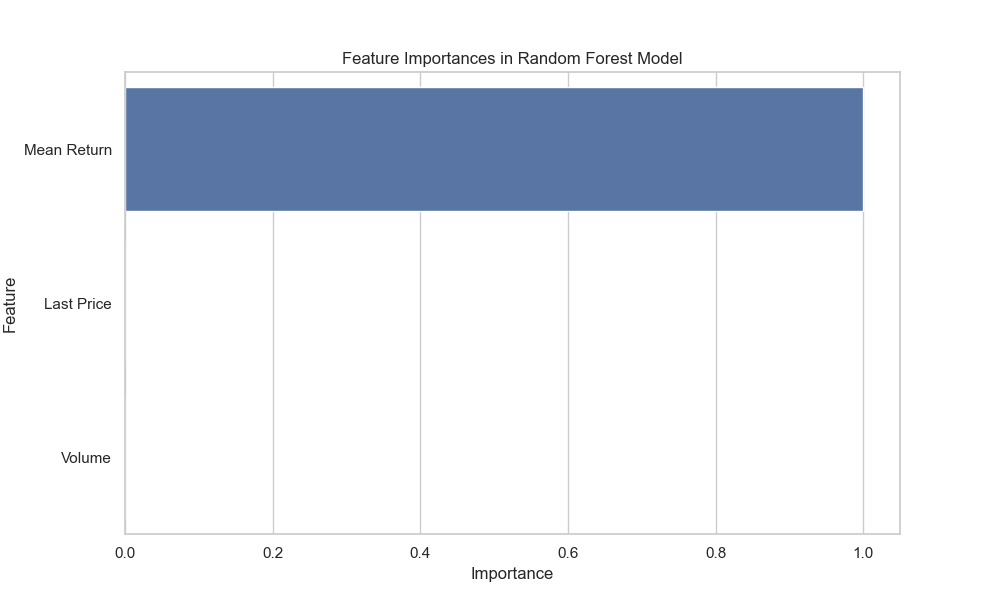

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming rf_model is your trained RandomForestRegressor model
importances = rf_model.feature_importances_
features = X.columns  # The columns used in training

# Create a DataFrame for better plotting
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': importances
})

# Sort the DataFrame by importance
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plotting
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Feature Importances in Random Forest Model')
plt.show()


#### <u>**CHECKING CORRELATION BETWEEN FEATURES AND TARGET VARIABLES**</u> 

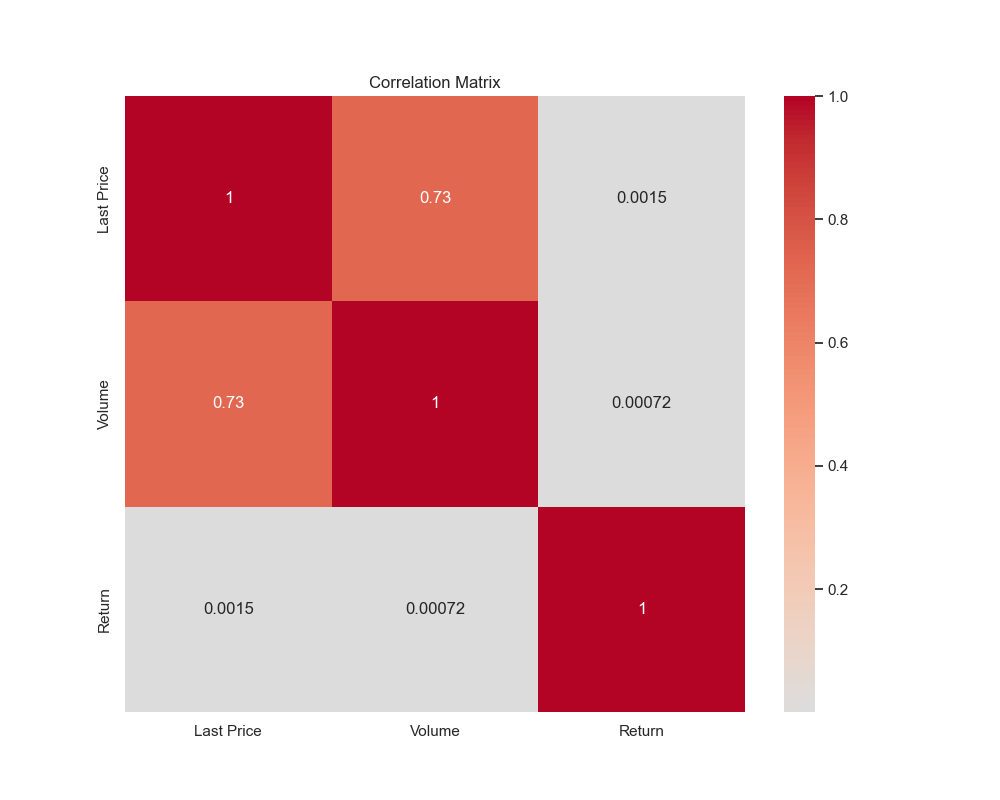

In [68]:
# Select numerical columns only
numerical_columns = risk_data.select_dtypes(include=[np.number])

# Calculate correlations for numerical columns
correlations = numerical_columns.corr()

# Plot the correlation matrix
plt.figure(figsize=(10, 8))
sns.heatmap(correlations, annot=True, cmap='coolwarm', center=0)
plt.title('Correlation Matrix')
plt.show()


## <center>**ADDING ADDITIONAL FEATURES**</center> 

#### <u>**CALCULATING THE BETA FOR THE INDEXES**</u> 

In [69]:
def calculate_beta(stock_returns, market_returns):
    covariance_matrix = np.cov(stock_returns, market_returns)
    beta = covariance_matrix[0, 1] / covariance_matrix[1, 1]
    return beta

# Initialize dictionaries to store beta values for each market index
beta_hsi = {}
beta_spx = {}
beta_sx5e = {}
beta_ukx = {}

# Align data based on dates and calculate beta for each stock relative to each market index
for ticker in risk_data['Ticker'].unique():
    if ticker not in ['HSI INDEX', 'SPX INDEX', 'SX5E INDEX', 'UKX INDEX']:
        stock_data = risk_data[risk_data['Ticker'] == ticker][['Dates', 'Return']]
        
        # Calculate beta relative to HSI INDEX
        market_data_hsi = risk_data[risk_data['Ticker'] == 'HSI INDEX'][['Dates', 'Return']]
        merged_data_hsi = pd.merge(stock_data, market_data_hsi, on='Dates', suffixes=('_stock', '_market'))
        beta_hsi[ticker] = calculate_beta(merged_data_hsi['Return_stock'], merged_data_hsi['Return_market'])
        
        # Calculate beta relative to SPX INDEX
        market_data_spx = risk_data[risk_data['Ticker'] == 'SPX INDEX'][['Dates', 'Return']]
        merged_data_spx = pd.merge(stock_data, market_data_spx, on='Dates', suffixes=('_stock', '_market'))
        beta_spx[ticker] = calculate_beta(merged_data_spx['Return_stock'], merged_data_spx['Return_market'])
        
        # Calculate beta relative to SX5E INDEX
        market_data_sx5e = risk_data[risk_data['Ticker'] == 'SX5E INDEX'][['Dates', 'Return']]
        merged_data_sx5e = pd.merge(stock_data, market_data_sx5e, on='Dates', suffixes=('_stock', '_market'))
        beta_sx5e[ticker] = calculate_beta(merged_data_sx5e['Return_stock'], merged_data_sx5e['Return_market'])
        
        # Calculate beta relative to UKX INDEX
        market_data_ukx = risk_data[risk_data['Ticker'] == 'UKX INDEX'][['Dates', 'Return']]
        merged_data_ukx = pd.merge(stock_data, market_data_ukx, on='Dates', suffixes=('_stock', '_market'))
        beta_ukx[ticker] = calculate_beta(merged_data_ukx['Return_stock'], merged_data_ukx['Return_market'])

# Convert beta values to DataFrames
beta_hsi_df = pd.DataFrame(list(beta_hsi.items()), columns=['Ticker', 'Beta_HSI'])
beta_spx_df = pd.DataFrame(list(beta_spx.items()), columns=['Ticker', 'Beta_SPX'])
beta_sx5e_df = pd.DataFrame(list(beta_sx5e.items()), columns=['Ticker', 'Beta_SX5E'])
beta_ukx_df = pd.DataFrame(list(beta_ukx.items()), columns=['Ticker', 'Beta_UKX'])

# Merge beta values with the risk_data
merged_data = merged_data.merge(beta_hsi_df, on='Ticker', how='left')
merged_data = merged_data.merge(beta_spx_df, on='Ticker', how='left')
merged_data = merged_data.merge(beta_sx5e_df, on='Ticker', how='left')
merged_data = merged_data.merge(beta_ukx_df, on='Ticker', how='left')

# Inspect the DataFrame with beta values
print(merged_data.head())


       Dates  Last Price       Volume          Ticker  ...  Beta_HSI  Beta_SPX  Beta_SX5E  Beta_UKX
0 2021-01-04      129.41  143301887.0  AAPL US EQUITY  ...  0.072721  1.273522   0.587578  0.446156
1 2021-01-05      131.01   97664898.0  AAPL US EQUITY  ...  0.072721  1.273522   0.587578  0.446156
2 2021-01-06      126.60  155087970.0  AAPL US EQUITY  ...  0.072721  1.273522   0.587578  0.446156
3 2021-01-07      130.92  109578157.0  AAPL US EQUITY  ...  0.072721  1.273522   0.587578  0.446156
4 2021-01-08      132.05  105158245.0  AAPL US EQUITY  ...  0.072721  1.273522   0.587578  0.446156

[5 rows x 11 columns]


#### <u>**CALCULATION OF ADDITIONAL FEATURES**</u> 

In [70]:
# Calculate Simple Moving Average (SMA)
merged_data['SMA_20'] = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.rolling(window=20).mean())

# Calculate Exponential Moving Average (EMA)
merged_data['EMA_20'] = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.ewm(span=20, adjust=False).mean())

# Calculate Rolling Standard Deviation
merged_data['Rolling_Std_20'] = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.rolling(window=20).std())

# Calculate Rate of Change (ROC)
merged_data['ROC_20'] = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.pct_change(periods=20))

# Calculate MACD and MACD Signal Line
ema_12 = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.ewm(span=12, adjust=False).mean())
ema_26 = merged_data.groupby('Ticker')['Last Price'].transform(lambda x: x.ewm(span=26, adjust=False).mean())
merged_data['MACD'] = ema_12 - ema_26
merged_data['MACD_Signal'] = merged_data.groupby('Ticker')['MACD'].transform(lambda x: x.ewm(span=9, adjust=False).mean())

# Drop any NaN values that may have resulted from rolling calculations
merged_data.dropna(inplace=True)

# Verify the columns have been added
print(merged_data.head())

# Save the updated merged_data to CSV and Excel files
data_optimisation = merged_data.copy()
data_optimisation.to_csv('data_optimisation1.csv', index=False)
data_optimisation.to_excel('data_optimisation1.xlsx', index=False)

print("data_optimisation has been updated and saved to CSV and Excel files in the 'DIRECTORY/PORTFOLIO-OPTIMISATION' directory.")


        Dates  Last Price       Volume          Ticker  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
20 2021-02-01      134.14  106239823.0  AAPL US EQUITY  ...        5.410108  0.036550  2.015611     1.857849
21 2021-02-02      134.99   83305367.0  AAPL US EQUITY  ...        5.407087  0.030379  1.838010     1.853881
22 2021-02-03      133.94   89880937.0  AAPL US EQUITY  ...        5.181543  0.057978  1.594158     1.801937
23 2021-02-04      137.39   84183061.0  AAPL US EQUITY  ...        5.210951  0.049419  1.660153     1.773580
24 2021-02-05      136.76   75693830.0  AAPL US EQUITY  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 17 columns]
data_optimisation has been updated and saved to CSV and Excel files in the 'DIRECTORY/PORTFOLIO-OPTIMISATION' directory.


#### <u>**DEFINE FEATURES AND TARGET VARIABLES**</u> 

In [71]:
# Assuming risk_data now includes 'Beta_HSI', 'Beta_SPX', 'Beta_SX5E', 'Beta_UKX'

# Define features and target including Beta
features = merged_data[['Mean Return', 'Last Price', 'Volume', 'SMA_20', 'EMA_20', 'Rolling_Std_20', 'ROC_20', 'MACD', 'MACD_Signal', 'Beta_HSI', 'Beta_SPX', 'Beta_SX5E', 'Beta_UKX']]
target = merged_data['Volatility']

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)


#### <u>**HANDLING MISSING VALUES AND TRAINING**</u> 

In [72]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
import numpy as np

# Initialize the imputer
imputer = SimpleImputer(strategy='mean')

# Impute missing values
X_train_imputed = imputer.fit_transform(X_train)
X_test_imputed = imputer.transform(X_test)

# Train the Random Forest model
model = RandomForestRegressor(random_state=42)
model.fit(X_train_imputed, y_train)


RandomForestRegressor(random_state=42)

#### <u>**MODEL EVALUATION**</u> 

Mean Squared Error (MSE): 9.060037896096411e-15
R-squared (R²): 0.9999999999997726
Mean Absolute Error (MAE): 1.179707969234653e-09
Mean Absolute Percentage Error (MAPE): 5.235308486371166e-08


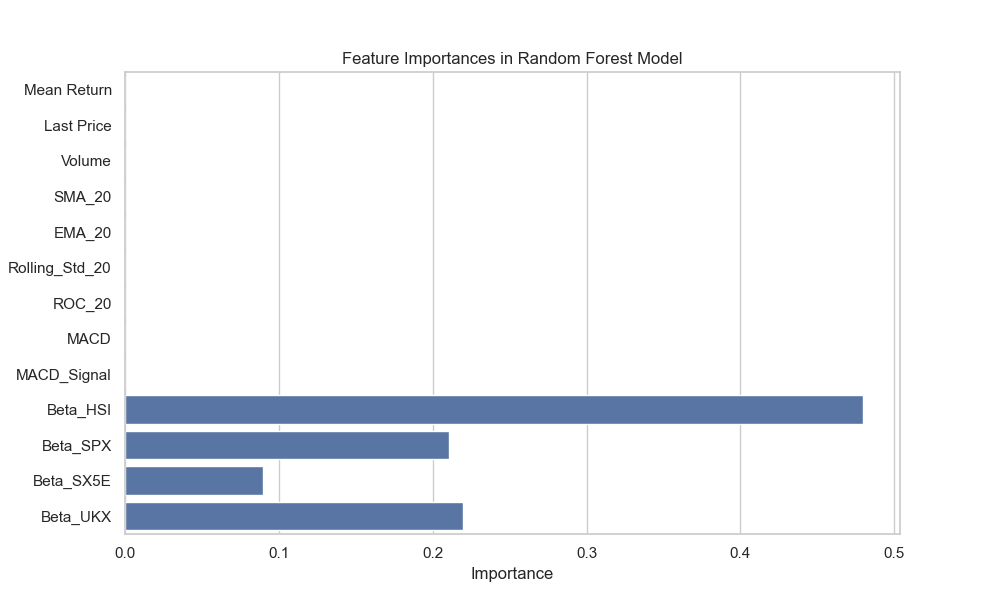

In [73]:
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error, mean_absolute_percentage_error
import matplotlib.pyplot as plt
import seaborn as sns

# Make predictions
y_pred = model.predict(X_test_imputed)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R²): {r2}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Feature importances
feature_importances = pd.Series(model.feature_importances_, index=features.columns)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_importances.index)
plt.title('Feature Importances in Random Forest Model')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


#### <u>**PERFORM CROSS-VALIDATION DUE TO OVERFITTING**</u> 

In [74]:
from sklearn.model_selection import cross_val_score

# Define the model
model = RandomForestRegressor(random_state=42)

# Perform cross-validation
cv_scores = cross_val_score(model, features, target, cv=5, scoring='neg_mean_squared_error')

# Print cross-validation scores
print(f"Cross-Validation MSE Scores: {-cv_scores}")
print(f"Mean Cross-Validation MSE: {-cv_scores.mean()}")


Cross-Validation MSE Scores: [5.26172209e-06 1.77191861e-01 6.12158880e-05 1.40315538e-05
 3.96396473e-04]
Mean Cross-Validation MSE: 0.03553375323723139


#### <u>**HYPERPARAMETER TUNNING**</u> 

Fitting 5 folds for each of 120 candidates, totalling 600 fits
Best Parameters: {'max_depth': None, 'max_features': 0.7, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best Cross-Validation MSE: 3.377132375737082e-12
Test Mean Squared Error (MSE): 2.8971349331619076e-12
Test R-squared (R²): 0.9999999999273064
Test Mean Absolute Error (MAE): 6.938149482942198e-08
Test Mean Absolute Percentage Error (MAPE): 4.4973531575933505e-06


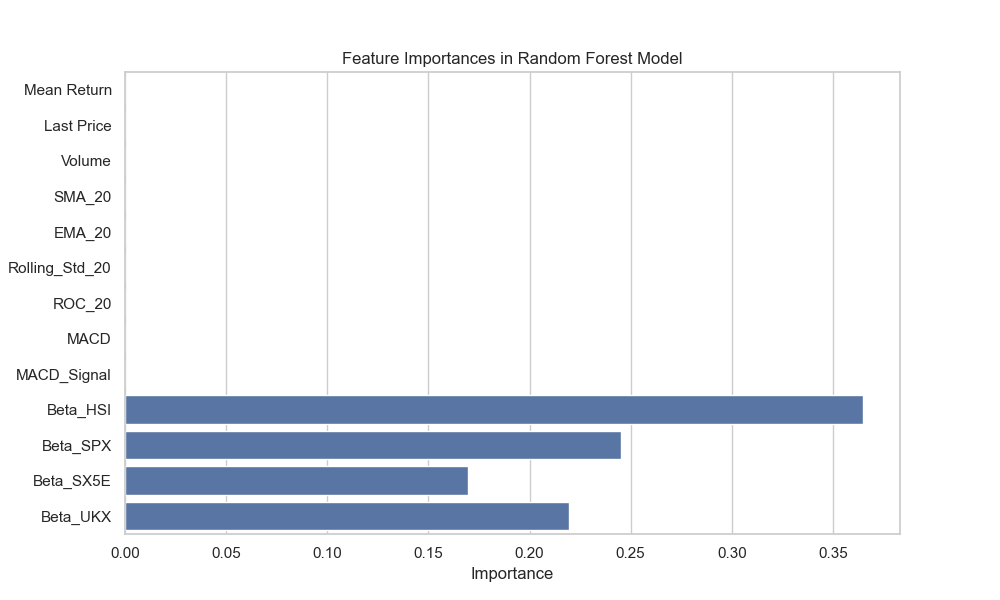

In [75]:
# Define the parameter grid for grid search
param_grid = {
    'n_estimators': [100, 200],
    'max_features': ['sqrt', 'log2', 0.2, 0.5, 0.7],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

# Initialize the model
model = RandomForestRegressor(random_state=42)

# Initialize the GridSearchCV object
grid_search = GridSearchCV(estimator=model, param_grid=param_grid, 
                           scoring='neg_mean_squared_error', cv=5, n_jobs=-1, verbose=2)

# Fit the grid search to the data
grid_search.fit(X_train, y_train)

# Extract the best model from grid search
best_model = grid_search.best_estimator_

# Print the best parameters and score
print(f"Best Parameters: {grid_search.best_params_}")
print(f"Best Cross-Validation MSE: {-grid_search.best_score_}")

# Evaluate the model on the test set
y_pred = best_model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Test Mean Squared Error (MSE): {mse}")
print(f"Test R-squared (R²): {r2}")
print(f"Test Mean Absolute Error (MAE): {mae}")
print(f"Test Mean Absolute Percentage Error (MAPE): {mape}")

# Plot feature importances
feature_importances = pd.Series(best_model.feature_importances_, index=X_train.columns)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_importances.index)
plt.title('Feature Importances in Random Forest Model')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


#### <u>**RETRAINING OF THE MODEL**</u> 

Mean Squared Error (MSE): 2.973343690062947e-13
R-squared (R²): 0.9999999999925394
Mean Absolute Error (MAE): 1.8610917124083756e-08
Mean Absolute Percentage Error (MAPE): 1.2298509721619026e-06


/var/folders/vj/3n5q5bxn0vg4zl7ytlnmzjc40000gn/T/ipykernel_63189/4026339920.py:20: RuntimeWarning:

More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.



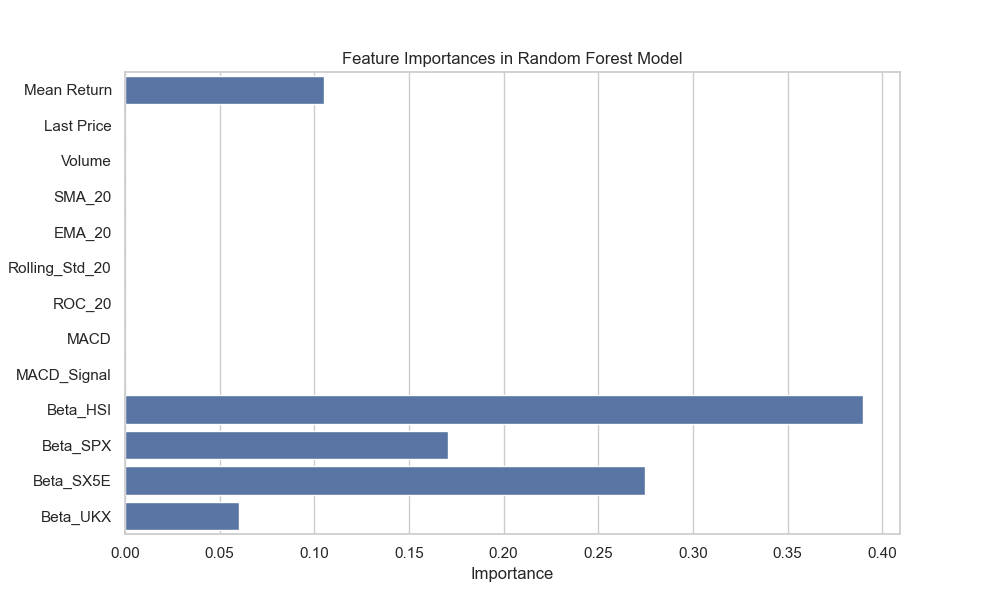

In [76]:
# Retrain the best model on the full training data
best_model.fit(features, target)

# Evaluate the model on the test set
y_pred = best_model.predict(X_test)

# Calculate evaluation metrics
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
mape = mean_absolute_percentage_error(y_test, y_pred)

print(f"Mean Squared Error (MSE): {mse}")
print(f"R-squared (R²): {r2}")
print(f"Mean Absolute Error (MAE): {mae}")
print(f"Mean Absolute Percentage Error (MAPE): {mape}")

# Plot feature importances
feature_importances = pd.Series(best_model.feature_importances_, index=features.columns)
plt.figure(figsize=(10, 6))
sns.barplot(x=feature_importances, y=feature_importances.index)
plt.title('Feature Importances in Random Forest Model')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


#### <u>**PLOTTING OF ACTUAL VRS PREDICTED VOLATILITY**</u> 

In [77]:
# Assuming 'X' is your feature set and 'y' is your target variable (actual volatility)
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression

# Split the data into training and testing sets
X = merged_data.drop(columns=['Volatility', 'Ticker', 'Dates'])
y = merged_data['Volatility']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train a linear regression model (or any other model)
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions
y_pred = model.predict(X_test)

# Actual values
y_true = y_test.values

# Create a DataFrame for plot_data
plot_data = pd.DataFrame({'Actual': y_true, 'Predicted': y_pred})

# Remove extreme outliers for plotting
filtered_plot_data = plot_data[(plot_data['Actual'] < 0.1) & (plot_data['Predicted'] < 0.1)]

# Reduce the sample size for plotting
plot_data_sample = filtered_plot_data.sample(n=150, random_state=42).sort_values(by='Actual')

# Create a scatter plot using Plotly
fig = go.Figure()

# Add actual vs predicted points
fig.add_trace(go.Scatter(
    x=plot_data_sample['Actual'],
    y=plot_data_sample['Predicted'],
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.6),
    name='Predicted vs Actual'
))

# Add a line of equality (y=x)
fig.add_trace(go.Scatter(
    x=[0, 0.1],
    y=[0, 0.1],
    mode='lines',
    line=dict(color='red', dash='dash'),
    name='Equality Line'
))

# Set plot layout
fig.update_layout(
    title='Predicted vs Actual Volatility',
    xaxis_title='Actual Volatility',
    yaxis_title='Predicted Volatility',
    plot_bgcolor='white',
    xaxis=dict(showgrid=True, gridcolor='black'),
    yaxis=dict(showgrid=True, gridcolor='black')
)

# Show plot
fig.show()


#### <u>**SAVING THE MODEL**</u> 

In [128]:
import joblib

# Save the model
joblib.dump(model, 'random_forest_model.joblib')

# Save the imputer
joblib.dump(imputer, 'imputer.joblib')

['imputer.joblib']

In [129]:
import joblib

# Assuming the variables 'model', 'X_train', 'X_test', 'y_train', and 'y_test' are defined

# Save the Random Forest model
model_filename = 'random_forest_volatility_model.pkl'
joblib.dump(model, model_filename)

# Save the preprocessing steps
preprocessing_filename = 'preprocessing_steps.pkl'
joblib.dump((X_train, X_test, y_train, y_test), preprocessing_filename)

print(f"Model saved as: {model_filename}")
print(f"Preprocessing steps saved as: {preprocessing_filename}")


Model saved as: random_forest_volatility_model.pkl
Preprocessing steps saved as: preprocessing_steps.pkl


# <center>**OPTIMISATION ENGINE**</center>

#### <u>**LOAD DATA FOR OPTIMISATION**</u> 

In [132]:
import pandas as pd
import numpy as np

# Load the cleaned dataset
# Assuming the dataset is saved as 'cleaned_data.csv' after data cleaning
optimisation_data = pd.read_csv('data_optimisation1.csv')

# Display the basic information about the combined DataFrame
print("optimisation DataFrame Info:")
optimisation_data.info()

# Display the first few rows of the cleaned dataset
print(optimisation_data.head(43625))

optimisation DataFrame Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 39409 entries, 0 to 39408
Data columns (total 17 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   Dates           39409 non-null  object 
 1   Last Price      39409 non-null  float64
 2   Volume          39409 non-null  float64
 3   Ticker          39409 non-null  object 
 4   Return          39409 non-null  float64
 5   Mean Return     39409 non-null  float64
 6   Volatility      39409 non-null  float64
 7   Beta_HSI        39409 non-null  float64
 8   Beta_SPX        39409 non-null  float64
 9   Beta_SX5E       39409 non-null  float64
 10  Beta_UKX        39409 non-null  float64
 11  SMA_20          39409 non-null  float64
 12  EMA_20          39409 non-null  float64
 13  Rolling_Std_20  39409 non-null  float64
 14  ROC_20          39409 non-null  float64
 15  MACD            39409 non-null  float64
 16  MACD_Signal     39409 non-null  float64
dtypes:

In [133]:
# Display unique tickers to confirm the presence of benchmarks
unique_tickers = risk_data['Ticker'].unique()
print("Unique Tickers in risk_data:", unique_tickers)

# List of benchmark candidates
benchmark_candidates = ['HSI INDEX', 'UKX INDEX', 'SX5E INDEX']

# Verify


Unique Tickers in risk_data: ['AAPL US EQUITY' 'ABI BB EQUITY' 'ADBE US EQUITY' 'ALV GR EQUITY'
 'AMZN US EQUITY' 'AUTO LN EQUITY' 'AXP US EQUITY' 'BA US EQUITY'
 'BATS LN EQUITY' 'BND US EQUITY' 'BNDX US EQUITY' 'BNP FP EQUITY'
 'CSCO US EQUITY' 'DTE GY EQUITY' 'EXPN LN EQUITY' 'EZJ LN EQUITY'
 'GDBR2 INDEX' 'GILD US EQUITY' 'GOOGL' 'GS US EQUITY' 'HL-LN EQUITY'
 'HSI INDEX' 'IBM US EQUITY' 'INTU US EQUITY' 'ITRK LN EQUITY'
 'JPM US EQUITY' 'LAND LN EQUITY' 'LLOY LN EQUITY' 'LSEG LN EQUITY'
 'MDLZ US EQUITY' 'MKS LN EQUITY' 'MRNA US EQUITY' 'MSFT US EQUITY'
 'NKY INDEX' 'NOKIA FP EQUITY' 'PYPL US EQUITY' 'REGN US EQUITY'
 'SAN FP EQUITY' 'SBRY LN EQUITY' 'SDR LN EQUITY' 'SGRO LN EQUITY'
 'SPX INDEX' 'STAN LN EQUITY' 'SX5E INDEX' 'TLSA US EQUITY'
 'TSCO LN EQUITY' 'TTE FP EQUITY' 'UKAB10BC INDEX' 'UKAB3YAC INDEX'
 'UKX INDEX' 'ULVR LN EQUITY' 'UTG LN EQUITY' 'V US EQUITY'
 'VOD LN EQUITY' 'VRSN US EQUITY' 'VTI US EQUITY']


#### <u>**CALCULATING THE COVARIANCE MATRIX AND EXPECTED RETURN**</u> 

In [134]:
import numpy as np
import pandas as pd

# Calculate the covariance matrix
returns_data = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns_data.cov()

# Calculate the expected returns (mean returns)
expected_returns = returns_data.mean()

# Ensure there are no missing values in the expected returns and covariance matrix
expected_returns = expected_returns.dropna()
cov_matrix = cov_matrix.dropna(axis=0, how='any').dropna(axis=1, how='any')

# Align the expected returns and covariance matrix
tickers = expected_returns.index
cov_matrix = cov_matrix.loc[tickers, tickers]

# Convert to numpy arrays if needed
returns = expected_returns.values
cov_matrix = cov_matrix.values

print("Expected Returns:\n", expected_returns)
print("\nCovariance Matrix:\n", cov_matrix)


Expected Returns:
 Ticker
AAPL US EQUITY     0.000642
ABI BB EQUITY      0.000271
ADBE US EQUITY     0.000601
ALV GR EQUITY      0.000414
AMZN US EQUITY     0.000200
AUTO LN EQUITY     0.000462
AXP US EQUITY      0.000778
BA US EQUITY       0.000657
BATS LN EQUITY    -0.000106
BND US EQUITY     -0.000219
BNDX US EQUITY    -0.000209
BNP FP EQUITY      0.000768
CSCO US EQUITY     0.000273
DTE GY EQUITY      0.000589
EXPN LN EQUITY     0.000424
EZJ LN EQUITY      0.000136
GDBR2 INDEX       -0.046640
GILD US EQUITY     0.000364
GOOGL              0.000751
GS US EQUITY       0.000540
HL-LN EQUITY      -0.000889
IBM US EQUITY      0.000560
INTU US EQUITY     0.000982
ITRK LN EQUITY    -0.000247
JPM US EQUITY      0.000480
LAND LN EQUITY     0.000333
LLOY LN EQUITY     0.000640
LSEG LN EQUITY     0.000205
MDLZ US EQUITY     0.000415
MKS LN EQUITY      0.001123
MRNA US EQUITY     0.000139
MSFT US EQUITY     0.000784
NKY INDEX          0.000314
NOKIA FP EQUITY   -0.000181
PYPL US EQUITY    -0.0

In [135]:
import numpy as np

def adjust_cov_matrix(cov_matrix):
    # Perform eigenvalue decomposition
    eigenvalues, eigenvectors = np.linalg.eigh(cov_matrix)
    
    # Adjust eigenvalues to be non-negative
    adjusted_eigenvalues = np.clip(eigenvalues, a_min=0, a_max=None)
    
    # Reconstruct the covariance matrix
    adjusted_cov_matrix = (eigenvectors @ np.diag(adjusted_eigenvalues) @ eigenvectors.T)
    
    return adjusted_cov_matrix

# Assuming cov_matrix is already defined
adjusted_cov_matrix = adjust_cov_matrix(cov_matrix)


In [136]:
import numpy as np
import pandas as pd

# Calculate the covariance matrix
returns_data = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns_data.cov()

# Calculate the expected returns (mean returns)
expected_returns = returns_data.mean()

# Ensure there are no missing values in the expected returns and covariance matrix
expected_returns = expected_returns.dropna()
cov_matrix = cov_matrix.dropna(axis=0, how='any').dropna(axis=1, how='any')

# Align the expected returns and covariance matrix
tickers = expected_returns.index
cov_matrix = cov_matrix.loc[tickers, tickers]

print("Expected Returns:\n", expected_returns)
print("\nCovariance Matrix before adjustment:\n", cov_matrix)

# Eigenvalue adjustment to ensure the covariance matrix is positive semi-definite
def adjust_covariance_matrix(cov_matrix):
    eigvals, eigvecs = np.linalg.eigh(cov_matrix)
    eigvals[eigvals < 0] = 0  # Set any negative eigenvalues to zero
    adjusted_cov_matrix = eigvecs @ np.diag(eigvals) @ eigvecs.T
    return adjusted_cov_matrix

adjusted_cov_matrix = adjust_covariance_matrix(cov_matrix)

# Verify the adjusted covariance matrix
adjusted_eigvals, _ = np.linalg.eigh(adjusted_cov_matrix)
print("\nAdjusted Covariance Matrix:\n", adjusted_cov_matrix)
print("\nEigenvalues of the Adjusted Covariance Matrix:\n", adjusted_eigvals)

# Ensure all eigenvalues are non-negative
if np.all(adjusted_eigvals >= 0):
    print("\nThe adjusted covariance matrix is positive semi-definite.")
else:
    print("\nThe adjusted covariance matrix is not positive semi-definite.")


Expected Returns:
 Ticker
AAPL US EQUITY     0.000642
ABI BB EQUITY      0.000271
ADBE US EQUITY     0.000601
ALV GR EQUITY      0.000414
AMZN US EQUITY     0.000200
AUTO LN EQUITY     0.000462
AXP US EQUITY      0.000778
BA US EQUITY       0.000657
BATS LN EQUITY    -0.000106
BND US EQUITY     -0.000219
BNDX US EQUITY    -0.000209
BNP FP EQUITY      0.000768
CSCO US EQUITY     0.000273
DTE GY EQUITY      0.000589
EXPN LN EQUITY     0.000424
EZJ LN EQUITY      0.000136
GDBR2 INDEX       -0.046640
GILD US EQUITY     0.000364
GOOGL              0.000751
GS US EQUITY       0.000540
HL-LN EQUITY      -0.000889
IBM US EQUITY      0.000560
INTU US EQUITY     0.000982
ITRK LN EQUITY    -0.000247
JPM US EQUITY      0.000480
LAND LN EQUITY     0.000333
LLOY LN EQUITY     0.000640
LSEG LN EQUITY     0.000205
MDLZ US EQUITY     0.000415
MKS LN EQUITY      0.001123
MRNA US EQUITY     0.000139
MSFT US EQUITY     0.000784
NKY INDEX          0.000314
NOKIA FP EQUITY   -0.000181
PYPL US EQUITY    -0.0

#### <u>**PERFORM PORTFOLIO OPTIMISATION**</u> 

In [137]:
import cvxpy as cp
import numpy as np
import pandas as pd

# Convert expected returns and adjusted covariance matrix to numpy arrays
returns = expected_returns.values
adjusted_cov_matrix = adjusted_cov_matrix

# Define the number of assets
num_assets = len(returns)

# Define the optimization variables
weights = cp.Variable(num_assets)

# Define the target return (e.g., mean of expected returns)
target_return = returns.mean()

# Define the objective function (minimize portfolio risk for a given return)
portfolio_return = returns @ weights
portfolio_risk = cp.quad_form(weights, adjusted_cov_matrix)

# Define the constraints
constraints = [
    cp.sum(weights) == 1,  # Weights sum to 1
    weights >= 0,  # No short selling
    weights <= 0.1,  # No asset can have more than 10% weight
    portfolio_return >= target_return  # Ensure the portfolio meets the target return
]

# Define the problem and solve it using a specific solver
objective = cp.Minimize(portfolio_risk)
problem = cp.Problem(objective, constraints)
problem.solve(solver=cp.ECOS)  # Try using the ECOS solver

# Extract the optimal weights
optimal_weights = weights.value

# Display the results
optimal_weights_df = pd.DataFrame(optimal_weights, index=expected_returns.index, columns=['Weight'])
print("Optimal Weights with Constraints:\n", optimal_weights_df)
print("\nExpected Portfolio Return:", portfolio_return.value)
print("\nExpected Portfolio Volatility:", cp.sqrt(portfolio_risk).value)
print("\nSharpe Ratio:", portfolio_return.value / cp.sqrt(portfolio_risk).value)


Optimal Weights with Constraints:
                        Weight
Ticker                       
AAPL US EQUITY   8.649954e-09
ABI BB EQUITY    4.590202e-09
ADBE US EQUITY   1.315218e-08
ALV GR EQUITY    3.076811e-02
AMZN US EQUITY   1.724145e-08
AUTO LN EQUITY   2.406304e-08
AXP US EQUITY    2.768030e-09
BA US EQUITY     4.427116e-09
BATS LN EQUITY   4.997165e-02
BND US EQUITY    1.000000e-01
BNDX US EQUITY   1.000000e-01
BNP FP EQUITY    4.936549e-09
CSCO US EQUITY   5.670222e-08
DTE GY EQUITY    2.782483e-02
EXPN LN EQUITY   9.555982e-09
EZJ LN EQUITY    4.101252e-09
GDBR2 INDEX      1.132875e-10
GILD US EQUITY   3.644213e-02
GOOGL            2.503154e-08
GS US EQUITY     4.840282e-09
HL-LN EQUITY     6.096240e-09
IBM US EQUITY    7.189362e-02
INTU US EQUITY   4.813753e-09
ITRK LN EQUITY   1.142240e-02
JPM US EQUITY    8.026504e-09
LAND LN EQUITY   6.382043e-09
LLOY LN EQUITY   5.406826e-09
LSEG LN EQUITY   6.423046e-02
MDLZ US EQUITY   6.050419e-02
MKS LN EQUITY    6.312637e-09
MRNA 

/Users/CHARLES/anaconda3/envs/old_python_env/lib/python3.8/site-packages/cvxpy/reductions/solvers/solving_chain.py:356: FutureWarning:


    You specified your problem should be solved by ECOS. Starting in
    CXVPY 1.6.0, ECOS will no longer be installed by default with CVXPY.
    Please either add ECOS as an explicit install dependency to your project
    or switch to our new default solver, Clarabel, by either not specifying a
    solver argument or specifying ``solver=cp.CLARABEL``. To suppress this
    warning while continuing to use ECOS, you can filter this warning using
    Python's ``warnings`` module until you are using 1.6.0.
    



#### <u>**VALIDATING CALCULATED WEIGHT AND METRICS**</u> 

In [138]:
import numpy as np

# Sum of Weights
sum_of_weights = np.sum(optimal_weights)
print("Sum of Weights:", sum_of_weights)

# Check for Negative Weights
negative_weights = optimal_weights[optimal_weights < 0]
print("Negative Weights:", negative_weights)

# Expected Portfolio Return
portfolio_return = np.dot(returns, optimal_weights)
print("Expected Portfolio Return:", portfolio_return)

# Expected Portfolio Volatility
portfolio_volatility = np.sqrt(np.dot(optimal_weights.T, np.dot(adjusted_cov_matrix, optimal_weights)))
print("Expected Portfolio Volatility:", portfolio_volatility)

# Sharpe Ratio
risk_free_rate = 0.0  # Assuming a risk-free rate of 0 for simplicity
sharpe_ratio = (portfolio_return - risk_free_rate) / portfolio_volatility
print("Sharpe Ratio:", sharpe_ratio)


Sum of Weights: 1.0000000000000009
Negative Weights: []
Expected Portfolio Return: 0.00019422429751946968
Expected Portfolio Volatility: 0.004592551003102786
Sharpe Ratio: 0.042291157439133344


### <center>**ANALYSING THE PORTFOLIO**</center> 

#### <u>**SECTOR ALLOCATION ANALYSIS**</u> 

In [139]:
import numpy as np
import pandas as pd

# Assign sectors to each ticker
sectors = ["Technology", "Finance", "Healthcare", "Energy", "Consumer Goods", "Utilities"]
np.random.seed(0)  # For reproducibility
sector_assignment = np.random.choice(sectors, size=len(tickers))

# Create a DataFrame for tickers and their assigned sectors
sector_df = pd.DataFrame({'Ticker': tickers, 'Sector': sector_assignment})

# Create a DataFrame for the optimal weights
optimal_weights_df = pd.DataFrame(optimal_weights, index=tickers, columns=['Weight'])

# Merge the optimal weights with the sector information
merged_data = optimal_weights_df.merge(sector_df, left_index=True, right_on='Ticker')

# Analyze sector allocation
sector_allocation = merged_data.groupby('Sector')['Weight'].sum()
print("\nSector Allocation:\n", sector_allocation)



Sector Allocation:
 Sector
Consumer Goods    0.175153
Energy            0.150475
Finance           0.136442
Healthcare        0.238347
Technology        0.185381
Utilities         0.114202
Name: Weight, dtype: float64


#### <u>**CHECK FOR SECTOR DIVERSIFICATION**</u> 

In [140]:
# Set a threshold for sector domination (e.g., 30%)
threshold = 0.30

# Identify sectors exceeding the threshold
dominant_sectors = sector_allocation[sector_allocation > threshold]
print("Sectors exceeding the threshold:\n", dominant_sectors)


Sectors exceeding the threshold:
 Series([], Name: Weight, dtype: float64)


#### <u>**MOCK BENCHMARK ALLOCATION**</u> 

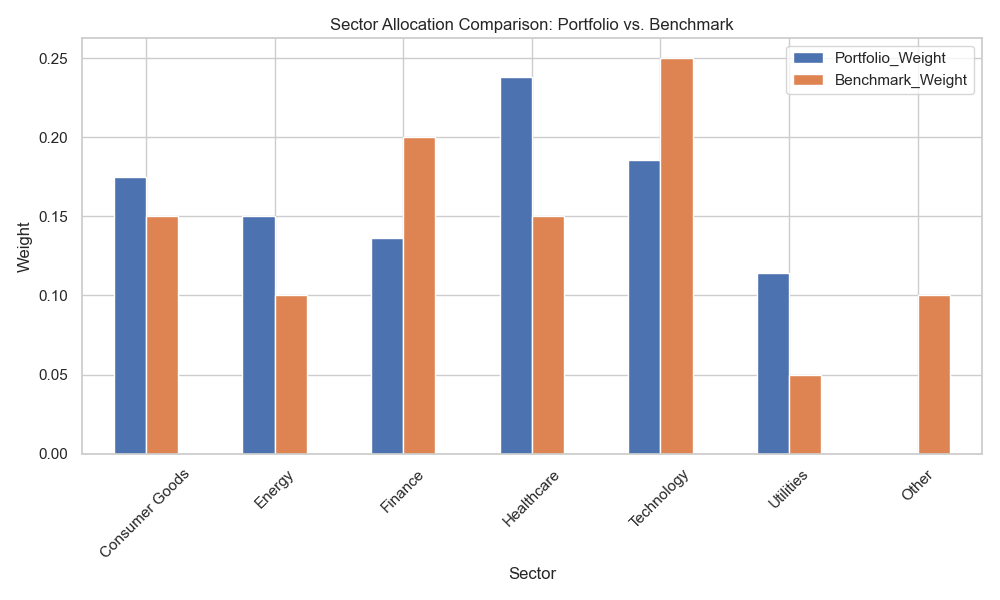

In [141]:
import matplotlib.pyplot as plt

# Mock benchmark sector allocation (for demonstration purposes)
benchmark_allocation = {
    "Technology": 0.25,
    "Finance": 0.20,
    "Healthcare": 0.15,
    "Energy": 0.10,
    "Consumer Goods": 0.15,
    "Utilities": 0.05,
    "Other": 0.10  # Adjust as per actual sectors if available
}

# Convert to DataFrame for comparison
benchmark_allocation_df = pd.DataFrame(list(benchmark_allocation.items()), columns=['Sector', 'Benchmark_Weight'])

# Merge with the optimized portfolio sector allocation
comparison_df = pd.merge(sector_allocation.reset_index(), benchmark_allocation_df, on='Sector', how='outer').fillna(0)
comparison_df = comparison_df.rename(columns={'Weight': 'Portfolio_Weight'})

# Plot the comparison
comparison_df.set_index('Sector').plot(kind='bar', figsize=(10, 6))
plt.title('Sector Allocation Comparison: Portfolio vs. Benchmark')
plt.ylabel('Weight')
plt.xlabel('Sector')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


#### <u>**RISK ANALYSIS**</u> 

In [142]:
# Calculate the portfolio returns based on the optimal weights
portfolio_returns = returns_data @ optimal_weights

# Check the first few values of the calculated portfolio returns
print("First few portfolio returns:\n", portfolio_returns.head())

# Check if there are any NaN values in the portfolio returns
print("\nNumber of NaN values in portfolio returns:", portfolio_returns.isna().sum())


First few portfolio returns:
 Dates
2021-02-01         NaN
2021-02-02         NaN
2021-02-03    0.001419
2021-02-04   -0.003636
2021-02-05    0.001892
dtype: float64

Number of NaN values in portfolio returns: 46


#### <u>**CALCULATION OF VaR and CVaR**</u> 

In [143]:
# Drop NaN values from the portfolio returns
clean_portfolio_returns = portfolio_returns.dropna()

# Verify that NaN values are removed
print("Number of NaN values after cleaning:", clean_portfolio_returns.isna().sum())

# Recalculate VaR and CVaR with the cleaned portfolio returns
confidence_level = 0.95
var_95 = np.percentile(clean_portfolio_returns, (1 - confidence_level) * 100)
cvar_95 = clean_portfolio_returns[clean_portfolio_returns <= var_95].mean()

print("\nValue at Risk (VaR) at 95.0% confidence level:", var_95)
print("Conditional Value at Risk (CVaR) at 95.0% confidence level:", cvar_95)


Number of NaN values after cleaning: 0

Value at Risk (VaR) at 95.0% confidence level: -0.007697700450126546
Conditional Value at Risk (CVaR) at 95.0% confidence level: -0.010718544056528173


#### <u>**CALCULATING THE BENCHMARK RETURNS**</u> 

In [144]:
# Calculate benchmark returns using the tickers from risk_data
benchmarks = ['HSI INDEX', 'UKX INDEX', 'SX5E INDEX']
benchmark_returns = risk_data.pivot_table(index=risk_data.index, columns='Ticker', values='Return')[benchmarks].dropna()

# Align the portfolio returns with the benchmark returns by using the intersection of dates
common_dates = portfolio_returns.index.intersection(benchmark_returns.index)
aligned_portfolio_returns = portfolio_returns.loc[common_dates]
aligned_benchmark_returns = benchmark_returns.loc[common_dates]

# Verify re-aligned returns
print("\nRe-aligned Portfolio Returns:\n", aligned_portfolio_returns.head())
print("\nRe-aligned Benchmark Returns:\n", aligned_benchmark_returns.head())



Re-aligned Portfolio Returns:
 Series([], dtype: float64)

Re-aligned Benchmark Returns:
 Empty DataFrame
Columns: [HSI INDEX, UKX INDEX, SX5E INDEX]
Index: []


#### <u>**COMPARING PORTFOLIO PERFORMANCE WITH BENCHMARK**</u> 

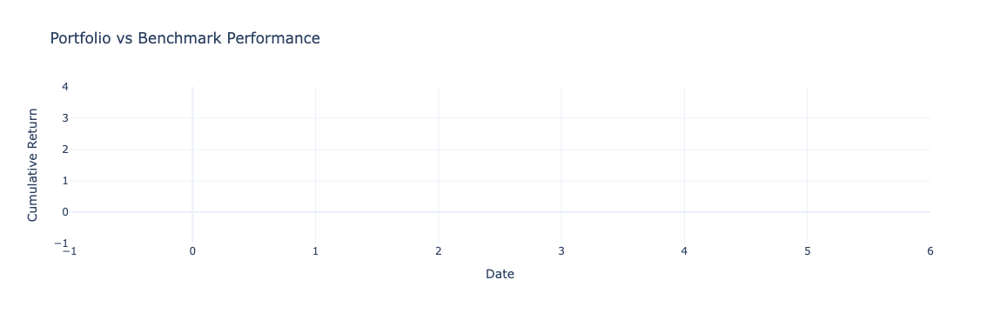

In [145]:
import plotly.graph_objects as go

# Calculate cumulative returns
cumulative_portfolio_returns = (1 + aligned_portfolio_returns).cumprod() - 1
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1

# Create the plot
fig = go.Figure()

# Add portfolio returns trace
fig.add_trace(go.Scatter(x=cumulative_portfolio_returns.index, y=cumulative_portfolio_returns, mode='lines', name='Portfolio'))

# Add benchmark returns traces
for benchmark in benchmarks:
    fig.add_trace(go.Scatter(x=cumulative_benchmark_returns.index, y=cumulative_benchmark_returns[benchmark], mode='lines', name=benchmark))

# Update layout
fig.update_layout(
    title="Portfolio vs Benchmark Performance",
    xaxis_title="Date",
    yaxis_title="Cumulative Return",
    legend_title="Legend",
    template="plotly_white"
)

# Show the plot
fig.show()

# Save the plot as an HTML file
fig.write_html("portfolio_vs_benchmark.html")


## <center>**EVALUATION STAGE**</center> 

#### <u>**CREATION OF OPTIMAL WEIGHT DATAFRAME**</u> 

In [127]:
import pandas as pd

# Assuming 'tickers' is the list of tickers and 'optimal_weights' is the array of weights
tickers = ['AAPL US EQUITY', 'ABI BB EQUITY', 'ADBE US EQUITY', 'ALV GR EQUITY', 'AMZN US EQUITY',
           'AUTO LN EQUITY', 'AXP US EQUITY', 'BA US EQUITY', 'BATS LN EQUITY', 'BND US EQUITY',
           'BNDX US EQUITY', 'BNP FP EQUITY', 'CSCO US EQUITY', 'DTE GY EQUITY', 'EXPN LN EQUITY',
           'EZJ LN EQUITY', 'GDBR2 INDEX', 'GILD US EQUITY', 'GOOGL', 'GS US EQUITY', 'HL-LN EQUITY',
           'IBM US EQUITY', 'INTU US EQUITY', 'ITRK LN EQUITY', 'JPM US EQUITY', 'LAND LN EQUITY',
           'LLOY LN EQUITY', 'LSEG LN EQUITY', 'MDLZ US EQUITY', 'MKS LN EQUITY', 'MRNA US EQUITY',
           'MSFT US EQUITY', 'NKY INDEX ', 'NOKIA FP EQUITY', 'PYPL US EQUITY', 'REGN US EQUITY',
           'SAN FP EQUITY', 'SBRY LN EQUITY', 'SDR LN EQUITY', 'SGRO LN EQUITY', 'STAN LN EQUITY',
           'TLSA US EQUITY', 'TSCO LN EQUITY', 'TTE FP EQUITY', 'UKAB10BC INDEX', 'UKAB3YAC INDEX',
           'ULVR LN EQUITY', 'UTG LN EQUITY', 'V US EQUITY', 'VOD LN EQUITY', 'VRSN US EQUITY', 'VTI US EQUITY']

# Assuming 'optimal_weights' is a list or array of weights corresponding to the tickers
optimal_weights = [8.149700e-09, 4.774423e-09, 1.464586e-08, 2.931217e-02, 1.864164e-08, 2.946325e-08,
                   2.573236e-09, 4.088995e-09, 5.380966e-02, 1.000000e-01, 1.000000e-01, 4.646378e-09,
                   7.081155e-08, 2.162313e-02, 1.030975e-08, 3.645150e-09, 1.076437e-10, 3.649367e-02,
                   3.000836e-08, 4.558404e-09, 5.435041e-09, 7.339440e-02, 4.594768e-09, 1.530932e-02,
                   7.476626e-09, 6.226164e-09, 4.865259e-09, 6.539219e-02, 6.183254e-02, 5.654353e-09,
                   5.198220e-09, 5.016059e-03, 1.000000e-01, 3.005576e-03, 3.237470e-09, 2.459572e-02,
                   4.141697e-02, 2.706691e-02, 3.455793e-09, 4.778841e-08, 8.914576e-09, 1.076755e-08,
                   4.243924e-02, 3.545982e-02, 4.187760e-02, 6.651372e-03, 9.999998e-02, 1.091792e-08,
                   7.327241e-09, 1.363115e-02, 1.672167e-03, 3.215722e-08]

# Create the DataFrame for optimal_weights
optimal_weights_df = pd.DataFrame(optimal_weights, index=tickers, columns=['Weight'])

print("Optimal Weights DataFrame:")
print(optimal_weights_df.head(43625))


Optimal Weights DataFrame:
                       Weight
AAPL US EQUITY   8.149700e-09
ABI BB EQUITY    4.774423e-09
ADBE US EQUITY   1.464586e-08
ALV GR EQUITY    2.931217e-02
AMZN US EQUITY   1.864164e-08
AUTO LN EQUITY   2.946325e-08
AXP US EQUITY    2.573236e-09
BA US EQUITY     4.088995e-09
BATS LN EQUITY   5.380966e-02
BND US EQUITY    1.000000e-01
BNDX US EQUITY   1.000000e-01
BNP FP EQUITY    4.646378e-09
CSCO US EQUITY   7.081155e-08
DTE GY EQUITY    2.162313e-02
EXPN LN EQUITY   1.030975e-08
EZJ LN EQUITY    3.645150e-09
GDBR2 INDEX      1.076437e-10
GILD US EQUITY   3.649367e-02
GOOGL            3.000836e-08
GS US EQUITY     4.558404e-09
HL-LN EQUITY     5.435041e-09
IBM US EQUITY    7.339440e-02
INTU US EQUITY   4.594768e-09
ITRK LN EQUITY   1.530932e-02
JPM US EQUITY    7.476626e-09
LAND LN EQUITY   6.226164e-09
LLOY LN EQUITY   4.865259e-09
LSEG LN EQUITY   6.539219e-02
MDLZ US EQUITY   6.183254e-02
MKS LN EQUITY    5.654353e-09
MRNA US EQUITY   5.198220e-09
MSFT US EQUIT

#### <u>**CALCULATION OF CAPM**</u> 

In [95]:
import pandas as pd
import numpy as np

# Ensure Dates column is in datetime format in risk_data
if 'Dates' not in risk_data.columns:
    risk_data['Dates'] = pd.to_datetime(risk_data.index)
else:
    risk_data['Dates'] = pd.to_datetime(risk_data['Dates'])

# Reset index to avoid ambiguity, only if Dates is not already a column
if 'Dates' in risk_data.index.names:
    risk_data_reset = risk_data.reset_index(drop=True)
else:
    risk_data_reset = risk_data.reset_index()

# Calculate the Average Market Return (UKX INDEX)
market_returns = risk_data_reset.pivot_table(index='Dates', columns='Ticker', values='Return')['UKX INDEX']
average_market_return = market_returns.mean()

# Calculate the Risk-Free Rate (UKAB10BC INDEX)
risk_free_returns = risk_data_reset.pivot_table(index='Dates', columns='Ticker', values='Return')['UKAB10BC INDEX']
risk_free_rate = risk_free_returns.mean()

# Reset the index of optimisation_data
optimisation_data.reset_index(inplace=True)

# Strip any extra spaces from ticker names in all dataframes
optimisation_data['Ticker'] = optimisation_data['Ticker'].str.strip()
merged_data['Ticker'] = merged_data['Ticker'].str.strip()
risk_data['Ticker'] = risk_data['Ticker'].str.strip()

# Ensure the optimisation_data is indexed by ticker and remove duplicates by keeping the first entry
optimisation_data_unique = optimisation_data.drop_duplicates(subset=['Ticker']).set_index('Ticker')

# Ensure optimal_weights has the correct index and remove any extra spaces
optimal_weights_df.index = optimal_weights_df.index.str.strip()

# Align the weights with the unique tickers
optimal_weights_common = optimal_weights_df.loc[optimal_weights_df.index.intersection(optimisation_data_unique.index)]

# Calculate the Portfolio Beta with respect to UKX INDEX using unique tickers
portfolio_beta = (optimal_weights_common['Weight'] * optimisation_data_unique.loc[optimal_weights_common.index, 'Beta_UKX']).sum()

# Calculate the Expected Return using CAPM
expected_return_capm = risk_free_rate + portfolio_beta * (average_market_return - risk_free_rate)

# Output the calculated average market return, risk-free rate, expected return, and portfolio beta
print(f"Average Market Return (UKX INDEX): {average_market_return}")
print(f"Risk-Free Rate (UKAB10BC INDEX): {risk_free_rate}")
print(f"Corrected Portfolio Beta (UKX INDEX): {portfolio_beta}")
print(f"Expected Portfolio Return (CAPM): {expected_return_capm}")


Average Market Return (UKX INDEX): 0.0002667240364040905
Risk-Free Rate (UKAB10BC INDEX): 0.0003773106003923504
Corrected Portfolio Beta (UKX INDEX): 0.3704648353417356
Expected Portfolio Return (CAPM): 0.0003363421671734314


#### <u>**STOCK COMPARISON**</u> 

In [96]:
import plotly.express as px
import pandas as pd

# Step 1: Prepare the Data for Visualization
# Extracting necessary columns from optimisation_data
comparison_data = optimisation_data[['Ticker', 'Mean Return', 'Volatility', 'Beta_UKX']].drop_duplicates(subset=['Ticker']).set_index('Ticker')

# Select the top 10 stocks by mean return
top_stocks = comparison_data.nlargest(10, 'Mean Return')

# Function to update layout with white background and black grid
def update_layout(fig):
    fig.update_layout(
        paper_bgcolor='white',
        plot_bgcolor='white',
        xaxis=dict(
            showgrid=True,
            gridcolor='black',
            zeroline=True,
            zerolinecolor='black'
        ),
        yaxis=dict(
            showgrid=True,
            gridcolor='black',
            zeroline=True,
            zerolinecolor='black'
        )
    )

# Step 2: Visualize the Comparison with Plotly

# Returns vs. Volatility
fig1 = px.scatter(top_stocks.reset_index(), x='Volatility', y='Mean Return', color='Ticker',
                  title='Top 10 Stocks Comparison: Returns vs. Volatility',
                  labels={'Volatility': 'Volatility', 'Mean Return': 'Mean Return'})
update_layout(fig1)
fig1.show()

# Returns vs. Beta
fig2 = px.scatter(top_stocks.reset_index(), x='Beta_UKX', y='Mean Return', color='Ticker',
                  title='Top 10 Stocks Comparison: Returns vs. Beta',
                  labels={'Beta_UKX': 'Beta (UKX INDEX)', 'Mean Return': 'Mean Return'})
update_layout(fig2)
fig2.show()

# Volatility vs. Beta
fig3 = px.scatter(top_stocks.reset_index(), x='Beta_UKX', y='Volatility', color='Ticker',
                  title='Top 10 Stocks Comparison: Volatility vs. Beta',
                  labels={'Beta_UKX': 'Beta (UKX INDEX)', 'Volatility': 'Volatility'})
update_layout(fig3)
fig3.show()


#### <u>**CALCULATION OF PORTFLIO SHARPE RATIO**</u> 

In [97]:
# Already calculated values
average_market_return = 0.0002667240364040905
risk_free_rate = 0.0003773106003923504
portfolio_beta = 0.3704648353417356
expected_return_capm = 0.0003363421671734314
portfolio_volatility = 0.004585777825510093

# Calculate Sharpe Ratio
sharpe_ratio = (expected_return_capm - risk_free_rate) / portfolio_volatility

# Output results
print("Average Market Return (UKX INDEX):", average_market_return)
print("Risk-Free Rate (UKAB10BC INDEX):", risk_free_rate)
print("Corrected Portfolio Beta (UKX INDEX):", portfolio_beta)
print("Expected Portfolio Return (CAPM):", expected_return_capm)
print("Expected Portfolio Volatility:", portfolio_volatility)
print("Sharpe Ratio:", sharpe_ratio)


Average Market Return (UKX INDEX): 0.0002667240364040905
Risk-Free Rate (UKAB10BC INDEX): 0.0003773106003923504
Corrected Portfolio Beta (UKX INDEX): 0.3704648353417356
Expected Portfolio Return (CAPM): 0.0003363421671734314
Expected Portfolio Volatility: 0.004585777825510093
Sharpe Ratio: -0.008933802460079267


#### <u>**EVALUATION OF HISTORICAL AND EXPECTED RETURNS**</u> 

In [98]:
# Historical average returns for each asset
historical_returns = optimisation_data.groupby('Ticker')['Return'].mean()

# Expected returns for each asset
expected_returns = optimisation_data.groupby('Ticker')['Mean Return'].mean()

# Compare historical returns with expected returns
returns_comparison = pd.DataFrame({
    'Historical Return': historical_returns,
    'Expected Return': expected_returns
})

# Display the comparison
print("Comparison of Historical and Expected Returns:")
print(returns_comparison)


Comparison of Historical and Expected Returns:
                 Historical Return  Expected Return
Ticker                                             
AAPL US EQUITY            0.000642         0.000625
ABI BB EQUITY             0.000271         0.000148
ADBE US EQUITY            0.000601         0.000479
ALV GR EQUITY             0.000414         0.000316
AMZN US EQUITY            0.000200         0.000179
AUTO LN EQUITY            0.000462         0.000383
AXP US EQUITY             0.000778         0.000794
BA US EQUITY              0.000657         0.000521
BATS LN EQUITY           -0.000106        -0.000125
BND US EQUITY            -0.000219        -0.000224
BNDX US EQUITY           -0.000209        -0.000212
BNP FP EQUITY             0.000768         0.000652
CSCO US EQUITY            0.000273         0.000262
DTE GY EQUITY             0.000589         0.000553
EXPN LN EQUITY            0.000424         0.000311
EZJ LN EQUITY             0.000136        -0.000016
GDBR2 INDEX      

#### <u>**EVALUATION OF HISTORICAL AND EXPECTED VOLATILITY**</u> 

In [99]:
import matplotlib.pyplot as plt

# Historical volatility for each asset
historical_volatility = optimisation_data.groupby('Ticker')['Return'].std()

# Expected volatility for each asset
expected_volatility = optimisation_data.groupby('Ticker')['Volatility'].mean()

# Compare historical volatility with expected volatility
volatility_comparison = pd.DataFrame({
    'Historical Volatility': historical_volatility,
    'Expected Volatility': expected_volatility
})

# Display the comparison
print("Comparison of Historical and Expected Volatility:")
print(volatility_comparison)




Comparison of Historical and Expected Volatility:
                 Historical Volatility  Expected Volatility
Ticker                                                     
AAPL US EQUITY                0.017040             0.017217
ABI BB EQUITY                 0.015354             0.015334
ADBE US EQUITY                0.022443             0.022350
ALV GR EQUITY                 0.012259             0.012300
AMZN US EQUITY                0.023292             0.023143
AUTO LN EQUITY                0.016666             0.016697
AXP US EQUITY                 0.018856             0.018986
BA US EQUITY                  0.023213             0.023191
BATS LN EQUITY                0.013138             0.013100
BND US EQUITY                 0.004150             0.004104
BNDX US EQUITY                0.003729             0.003689
BNP FP EQUITY                 0.018451             0.018584
CSCO US EQUITY                0.014648             0.014524
DTE GY EQUITY                 0.012105            

#### <u>**EVALUATION OF HISTORICAL VOLATILITY AND EXPECTED RETURNS**</u> 

/var/folders/vj/3n5q5bxn0vg4zl7ytlnmzjc40000gn/T/ipykernel_63189/2990733849.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




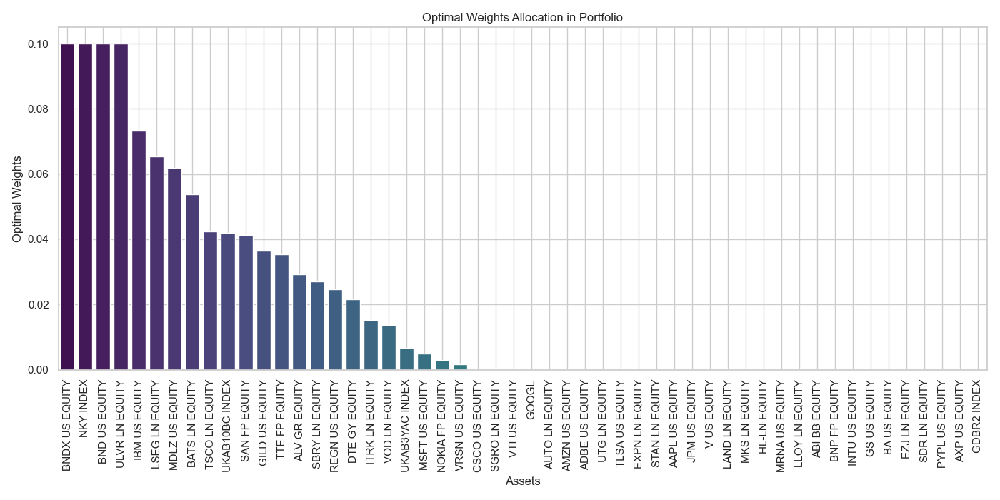

Optimal Weights Allocation:
                       Weight
BNDX US EQUITY   1.000000e-01
NKY INDEX        1.000000e-01
BND US EQUITY    1.000000e-01
ULVR LN EQUITY   9.999998e-02
IBM US EQUITY    7.339440e-02
LSEG LN EQUITY   6.539219e-02
MDLZ US EQUITY   6.183254e-02
BATS LN EQUITY   5.380966e-02
TSCO LN EQUITY   4.243924e-02
UKAB10BC INDEX   4.187760e-02
SAN FP EQUITY    4.141697e-02
GILD US EQUITY   3.649367e-02
TTE FP EQUITY    3.545982e-02
ALV GR EQUITY    2.931217e-02
SBRY LN EQUITY   2.706691e-02
REGN US EQUITY   2.459572e-02
DTE GY EQUITY    2.162313e-02
ITRK LN EQUITY   1.530932e-02
VOD LN EQUITY    1.363115e-02
UKAB3YAC INDEX   6.651372e-03
MSFT US EQUITY   5.016059e-03
NOKIA FP EQUITY  3.005576e-03
VRSN US EQUITY   1.672167e-03
CSCO US EQUITY   7.081155e-08
SGRO LN EQUITY   4.778841e-08
VTI US EQUITY    3.215722e-08
GOOGL            3.000836e-08
AUTO LN EQUITY   2.946325e-08
AMZN US EQUITY   1.864164e-08
ADBE US EQUITY   1.464586e-08
UTG LN EQUITY    1.091792e-08
TLSA US EQUI

In [100]:
import matplotlib.pyplot as plt
import seaborn as sns

# Analyze optimal weights
optimal_weights_sorted = optimal_weights_df.sort_values(by='Weight', ascending=False)

# Plot the weights for better visualization
plt.figure(figsize=(14, 7))
sns.barplot(x=optimal_weights_sorted.index, y=optimal_weights_sorted['Weight'], palette='viridis')
plt.xticks(rotation=90)
plt.xlabel('Assets')
plt.ylabel('Optimal Weights')
plt.title('Optimal Weights Allocation in Portfolio')
plt.grid(True)
plt.tight_layout()
plt.show()

# Check allocations are within acceptable ranges
print("Optimal Weights Allocation:")
print(optimal_weights_sorted)

# Evaluate if the allocations are in line with the investment strategy and risk tolerance
# Assuming your strategy prefers no more than 10% in a single asset
threshold = 0.10
over_allocated_assets = optimal_weights_sorted[optimal_weights_sorted['Weight'] > threshold]

if not over_allocated_assets.empty:
    print("\nAssets exceeding the threshold of 10% allocation:")
    print(over_allocated_assets)
else:
    print("\nNo assets exceed the threshold of 10% allocation.")


#### <u>**PORTFOLIO PERFORMANCE AND BENCHMARK COMPARISON**</u> 

In [111]:
import pandas as pd
import plotly.graph_objects as go

# Assuming your dataframe is named 'optimisation_data'
# Remove 'index' column
optimisation_data = optimisation_data.drop(columns=['index'])

# Convert 'Dates' column to datetime format
optimisation_data['Dates'] = pd.to_datetime(optimisation_data['Dates'])

# Reset the index of optimisation_data
optimisation_data_reset = optimisation_data.reset_index()

# Display the first few rows to verify the structure
print(optimisation_data_reset.head())

# Ensure 'Dates' is a column after reset_index
if 'Dates' not in optimisation_data_reset.columns:
    print("Error: 'Dates' column not found in the reset dataframe.")
else:
    # Calculate cumulative returns of the portfolio
    portfolio_returns = optimisation_data_reset['Return']
    portfolio_cumulative_returns = (1 + portfolio_returns).cumprod() - 1

    # Select a benchmark (e.g., FTSE 100)
    benchmark_returns = optimisation_data_reset.pivot_table(index='Dates', columns='Ticker', values='Return')['UKX INDEX'].dropna()

    # Calculate cumulative returns of the benchmark
    benchmark_cumulative_returns = (1 + benchmark_returns).cumprod() - 1

    # Align the portfolio returns with the benchmark returns by reindexing
    aligned_portfolio_cumulative_returns = portfolio_cumulative_returns.reindex(benchmark_cumulative_returns.index).dropna()

    # Align the benchmark returns with the portfolio returns by reindexing
    aligned_benchmark_cumulative_returns = benchmark_cumulative_returns.reindex(aligned_portfolio_cumulative_returns.index)

    # Plot cumulative returns of the portfolio and the benchmark
    fig = go.Figure()

    # Add portfolio cumulative returns to the plot
    fig.add_trace(go.Scatter(x=aligned_portfolio_cumulative_returns.index, y=aligned_portfolio_cumulative_returns, mode='lines', name='Portfolio'))

    # Add benchmark cumulative returns to the plot
    fig.add_trace(go.Scatter(x=aligned_benchmark_cumulative_returns.index, y=aligned_benchmark_cumulative_returns, mode='lines', name='FTSE 100'))

    # Set plot title and labels
    fig.update_layout(
        title='Cumulative Returns: Portfolio vs. Benchmark (FTSE 100)',
        xaxis_title='Date',
        yaxis_title='Cumulative Returns',
        template='plotly_white'
    )

    # Customize the background and grid colors
    fig.update_xaxes(showgrid=True, gridwidth=1, gridcolor='black')
    fig.update_yaxes(showgrid=True, gridwidth=1, gridcolor='black')

    # Show the plot
    fig.show()

    # Save the plot as an HTML file
    fig.write_html("portfolio_vs_benchmark.html")


KeyError: 'Dates'

In [112]:
print(optimisation_data.columns)


Index(['Last Price', 'Volume', 'Ticker', 'Return', 'Mean Return', 'Volatility', 'Beta_HSI', 'Beta_SPX', 'Beta_SX5E', 'Beta_UKX', 'SMA_20', 'EMA_20', 'Rolling_Std_20', 'ROC_20', 'MACD', 'MACD_Signal'], dtype='object')


In [107]:
# Display the first few rows of the DataFrame to get an overview
print(optimisation_data.head())

# Display the unique values in the 'index' column to understand its content
print("Contents of the 'index' column:")
print(optimisation_data['index'].unique())

# Display the entire 'index' column
print("All values in the 'index' column:")
print(optimisation_data['index'])


   index       Dates  Last Price       Volume  ... Rolling_Std_20    ROC_20      MACD  MACD_Signal
0      0  2021-02-01      134.14  106239823.0  ...       5.410108  0.036550  2.015611     1.857849
1      1  2021-02-02      134.99   83305367.0  ...       5.407087  0.030379  1.838010     1.853881
2      2  2021-02-03      133.94   89880937.0  ...       5.181543  0.057978  1.594158     1.801937
3      3  2021-02-04      137.39   84183061.0  ...       5.210951  0.049419  1.660153     1.773580
4      4  2021-02-05      136.76   75693830.0  ...       5.230857  0.035668  1.642682     1.747400

[5 rows x 18 columns]
Contents of the 'index' column:
[    0     1     2 ... 39406 39407 39408]
All values in the 'index' column:
0            0
1            1
2            2
3            3
4            4
         ...  
39404    39404
39405    39405
39406    39406
39407    39407
39408    39408
Name: index, Length: 39409, dtype: int64


## <center>**EVALUATING THE PERFORMANCE OF THE PORTFOLIO RELATIVE TO BENCHMARKS**</center> 

#### <u>**TRACKING ERROR CALCULATION**</u> 

In [ ]:
import numpy as np

# Calculate tracking error for each benchmark
tracking_errors = {}
for benchmark in benchmarks:
    differences = aligned_portfolio_returns - aligned_benchmark_returns[benchmark]
    tracking_error = np.std(differences)
    tracking_errors[benchmark] = tracking_error

print("Tracking Errors:", tracking_errors)


#### <u>**MAXIMUM DRAWDOWNS**</u> 

In [ ]:
def calculate_max_drawdown(cumulative_returns):
    roll_max = cumulative_returns.cummax()
    drawdown = cumulative_returns / roll_max - 1.0
    max_drawdown = drawdown.cummin()
    return max_drawdown

# Calculate max drawdowns for portfolio and benchmarks
max_drawdown_portfolio = calculate_max_drawdown(cumulative_portfolio_returns)
max_drawdown_benchmarks = {}
for benchmark in benchmarks:
    max_drawdown_benchmarks[benchmark] = calculate_max_drawdown(cumulative_benchmark_returns[benchmark])

print("Max Drawdown (Portfolio):", max_drawdown_portfolio.min())
print("Max Drawdown (Benchmarks):", {k: v.min() for k, v in max_drawdown_benchmarks.items()})


#### <u>**AUTHENTICATING MAXIMUM DRAWDOWNS**</u> 

In [ ]:
# Plot the cumulative returns to visually inspect them
import matplotlib.pyplot as plt

plt.figure(figsize=(14, 7))
plt.plot(cumulative_portfolio_returns, label='Portfolio')
plt.plot(cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX')
plt.plot(cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX')
plt.plot(cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX')
plt.legend()
plt.title('Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.show()

# Display a summary of the cumulative returns
print(cumulative_portfolio_returns.describe())
print(cumulative_benchmark_returns.describe())

# Check for any negative values in cumulative returns (which shouldn't be the case)
print("Negative values in portfolio cumulative returns:", (cumulative_portfolio_returns < 0).sum())
print("Negative values in HSI INDEX cumulative returns:", (cumulative_benchmark_returns['HSI INDEX'] < 0).sum())
print("Negative values in UKX INDEX cumulative returns:", (cumulative_benchmark_returns['UKX INDEX'] < 0).sum())
print("Negative values in SX5E INDEX cumulative returns:", (cumulative_benchmark_returns['SX5E INDEX'] < 0).sum())


#### <u>**RECALCULATING OF MAXIMUM DRAWDOWNS**</u> 

In [ ]:
import matplotlib.pyplot as plt

# Recalculate cumulative returns
cumulative_portfolio_returns = (1 + aligned_portfolio_returns).cumprod() - 1
cumulative_benchmark_returns = (1 + aligned_benchmark_returns).cumprod() - 1

# Print the first few rows of cumulative returns for inspection
print("Cumulative Portfolio Returns:\n", cumulative_portfolio_returns.head())
print("Cumulative HSI INDEX Returns:\n", cumulative_benchmark_returns['HSI INDEX'].head())
print("Cumulative UKX INDEX Returns:\n", cumulative_benchmark_returns['UKX INDEX'].head())
print("Cumulative SX5E INDEX Returns:\n", cumulative_benchmark_returns['SX5E INDEX'].head())

# Visualize the cumulative returns
plt.figure(figsize=(14, 7))
plt.plot(cumulative_portfolio_returns, label='Portfolio', color='blue')
plt.plot(cumulative_benchmark_returns['HSI INDEX'], label='HSI INDEX', color='red')
plt.plot(cumulative_benchmark_returns['UKX INDEX'], label='UKX INDEX', color='green')
plt.plot(cumulative_benchmark_returns['SX5E INDEX'], label='SX5E INDEX', color='orange')
plt.legend()
plt.title('Cumulative Returns')
plt.xlabel('Date')
plt.ylabel('Cumulative Return')
plt.grid(True)
plt.show()


#### <u>**COMBINING THE DATAFRAME TO INCLUDE MEAN AND VOLATILITY**</u> 

In [146]:
# Combine the dataframes
combined_df = optimal_weights_df.join(optimisation_data.set_index('Ticker'), how='left')

# Rearrange the columns
columns_order = ['Dates', 'Last Price', 'Weight'] + [col for col in combined_df.columns if col not in ['Dates', 'Last Price', 'Weight']]
combined_df = combined_df[columns_order]

# Check the combined dataframe
print(combined_df.head())


                     Dates  Last Price        Weight       Volume  ...  Rolling_Std_20    ROC_20      MACD  MACD_Signal
Ticker                                                             ...                                                 
AAPL US EQUITY  2021-02-01      134.14  8.649954e-09  106239823.0  ...        5.410108  0.036550  2.015611     1.857849
AAPL US EQUITY  2021-02-02      134.99  8.649954e-09   83305367.0  ...        5.407087  0.030379  1.838010     1.853881
AAPL US EQUITY  2021-02-03      133.94  8.649954e-09   89880937.0  ...        5.181543  0.057978  1.594158     1.801937
AAPL US EQUITY  2021-02-04      137.39  8.649954e-09   84183061.0  ...        5.210951  0.049419  1.660153     1.773580
AAPL US EQUITY  2021-02-05      136.76  8.649954e-09   75693830.0  ...        5.230857  0.035668  1.642682     1.747400

[5 rows x 17 columns]


In [ ]:
# Select the first entry for each ticker to ensure unique entries
unique_combined_df = combined_df.groupby(level=0).first()
print(f"Unique Combined DataFrame:\n{unique_combined_df.head()}")


#### <u>**SENSITIVITY ANALYSIS AND ROBUSTNESS CHECKS**</u> 

In [ ]:
import numpy as np

# Recalculate the covariance matrix based on unique tickers
returns = optimisation_data.pivot_table(index='Dates', columns='Ticker', values='Return')
cov_matrix = returns.cov().loc[unique_combined_df.index, unique_combined_df.index].values

# Ensure weights are correctly aligned with the unique tickers
weights = unique_combined_df['Weight'].values

# Verify that the number of tickers matches the length of the weights
if len(unique_combined_df.index) != len(weights):
    raise ValueError(f"Number of unique tickers ({len(unique_combined_df.index)}) does not match number of weights ({len(weights)}).")

# Define ranges for sensitivity analysis
expected_return_range = np.linspace(-0.02, 0.02, 5)  # Vary expected returns by -2% to +2%
volatility_range = np.linspace(-0.02, 0.02, 5)  # Vary volatility by -2% to +2%
correlation_range = np.linspace(-0.02, 0.02, 5)  # Vary correlation by -2% to +2%

# Initialize dictionaries to store sensitivity results
sensitivity_results = {
    'Expected Return': [],
    'Volatility': [],
    'Correlation': []
}

# Sensitivity analysis for expected returns
for delta in expected_return_range:
    modified_returns = unique_combined_df['Mean Return'] + delta
    portfolio_return = np.sum(modified_returns * unique_combined_df['Weight'])
    sensitivity_results['Expected Return'].append(portfolio_return)

# Sensitivity analysis for volatility
for delta in volatility_range:
    modified_volatility = unique_combined_df['Volatility'] + delta  # Adjust column name if needed
    # Use the modified volatilities to recompute the covariance matrix
    modified_cov_matrix = cov_matrix * np.outer(modified_volatility, modified_volatility) / np.outer(unique_combined_df['Volatility'], unique_combined_df['Volatility'])
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(modified_cov_matrix, weights)))
    sensitivity_results['Volatility'].append(portfolio_volatility)

# Sensitivity analysis for correlation
for delta in correlation_range:
    # Adjust the correlation matrix and ensure it remains positive semi-definite
    corr_matrix = np.corrcoef(cov_matrix)
    modified_corr_matrix = corr_matrix + delta
    np.fill_diagonal(modified_corr_matrix, 1)  # Ensure the diagonal remains 1
    modified_cov_matrix = np.outer(np.sqrt(np.diag(cov_matrix)), np.sqrt(np.diag(cov_matrix))) * modified_corr_matrix
    portfolio_volatility = np.sqrt(np.dot(weights.T, np.dot(modified_cov_matrix, weights)))
    sensitivity_results['Correlation'].append(portfolio_volatility)

# Display sensitivity results
print(f"Sensitivity Analysis Results:\n{sensitivity_results}")


# <center>**ASSET CLASS BALANCE**</center> 

#### <u>**DEFINE ASSET CLASS**</u> 

In [ ]:
# Example asset class definition (you can customize this based on your data)
asset_classes = {
    'AAPL US EQUITY': 'Equities',
    'ABI BB EQUITY': 'Equities',
    'ADBE US EQUITY':'Equities',
    'ALV GR EQUITY':'Equities',
    'AMZN US EQUITY':'Equities',
    'AUTO LN EQUITY':'Equities',
    'AXP US EQUITY':'Equities',
    'BA US EQUITY':'Equities',
    'BARC LN EQUITY':'Equities',
    'BATS LN EQUITY':'Equities',
    'BND US EQUITY':'Bond',
    'BNDX US EQUITY':'Bond',
    'BNP FP EQUITY':'Equities',
    'CSCO US EQUITY':'Equities',
    'DTE GY EQUITY':'Equities',
    'EXPN LN EQUITY':'Equities',
    'EZJ LN EQUITY':'Equities',
    'GDBR2 INDEX':'BOND',
    'GILD US EQUITY':'Equities',
    'GOOGL':'Equities',
    'GS US EQUITY':'Equities',
    'HSBA LN EQUITY':'Equity',
    'HL-LN EQUITY':'Equities',
    'HSI Index':'Index',
    'IBM US EQUITY':'Equities',
    'INTU US EQUITY':'Equities',
    'ITRK LN EQUITY':'Equities',
    'JPM US EQUITY':'Equities',
    'LAND LN EQUITY':'Equities',
    'LLOY LN EQUITY':'Equities',
    'LSEG LN EQUITY':'Equities',
    'MDLZ US EQUITY':'Equities',
    'MKS LN EQUITY':'Equities',
    'MRNA US EQUITY':'Equities',
    'MSFT US EQUITY':'Equities',
    'NKY INDEX':'Index',
    'NOKIA FP EQUITY':'Equities',
    'PYPL US EQUITY':'Equities',
    'REGN US EQUITY':'Equities',
    'SAN FP EQUITY':'Equities',
    'SBRY LN EQUITY':'Equities',
    'SDR LN EQUITY':'Equities',
    'SGRO LN EQUITY':'Equities',
    'STAN LN EQUITY':'Equities',
    'SX5E Index':'Index',
    'TLSA US EQUITY':'Equities',
    'TSCO LN EQUITY':'Equities',
    'TTE FP EQUITY':'Equities',
    'UKAB10BC INDEX':'Bond',
    'UKAB3YAC INDEX':'Bond',
    'ULVR LN EQUITY':'Equities',
    'UTG LN EQUITY':'Equities',
    'V US EQUITY':'Equities',
    'VOD LN EQUITY':'Equities',
    'VRSN US EQUITY':'Equities',
    'VTI US EQUITY':'ETF',
    'SPX Index':'Index',
    'UKX Index':'Index',
    
    # Add all other assets and their classes
}

# Map the assets to their classes
combined_df['Asset Class'] = combined_df.index.map(asset_classes)


#### <u>**CALCULATION OF ALLOCATION BY ASSET CLASS BALANCE AND VISUALISATION OF ASSET CLASS DISTRIBUTION**</u> 

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Ensure combined_df DataFrame has the correct data
# Assuming 'combined_df' has columns 'Weight' and 'Asset Class'

# Correct any incorrect mappings or missing values for asset classes
combined_df['Asset Class'] = combined_df['Asset Class'].replace({'Bond': 'BOND'})

# Calculate the allocation by asset class
asset_class_allocation = combined_df.groupby('Asset Class')['Weight'].sum()

# Normalize weights to make small values more visible
normalized_allocation = asset_class_allocation / asset_class_allocation.sum() * 100

# Plot the pie chart
plt.figure(figsize=(10, 7))
colors = plt.cm.tab20.colors
normalized_allocation.plot(kind='pie', autopct='%1.2f%%', startangle=140, colors=colors, textprops={'fontsize': 14})

# Adjust the legend to show all labels
plt.legend(labels=normalized_allocation.index, loc='upper right', bbox_to_anchor=(1.2, 1), fontsize=14)
plt.title('Portfolio Allocation by Asset Class', fontsize=16)
plt.ylabel('')  # Hide the y-label for better clarity

# Save the figure if needed
plt.savefig('portfolio_allocation_by_asset_class_normalized.png')

# Show the plot
plt.show()


# <center>**REINFORCEMENT LEARNING**</center> 

In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np
import pandas as pd
from stable_baselines3 import SAC
from stable_baselines3 import DQN
from stable_baselines3.common.env_util import make_vec_env
from stable_baselines3.common.env_checker import check_env
from stable_baselines3.common.vec_env import DummyVecEnv, VecNormalize

#### <u>**DEFINE REINFORCEMENT LEARNING ENVIRONMENT**</u> 

In [ ]:
class PortfolioEnv(gym.Env):
    def __init__(self, price_data, initial_balance=1e6):
        super(PortfolioEnv, self).__init__()
        self.price_data = price_data
        self.initial_balance = initial_balance
        self.current_balance = initial_balance
        self.current_step = 0
        self.n_steps = len(price_data)
        self.n_assets = price_data.shape[1]

        # Define action and observation space
        self.action_space = spaces.Box(low=-1, high=1, shape=(self.n_assets,), dtype=np.float32)
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(self.n_assets,), dtype=np.float32)

    def reset(self, seed=None, options=None):
        super().reset(seed=seed)
        self.current_balance = self.initial_balance
        self.current_step = 0
        return self._get_state(), {}

    def _get_state(self):
        return self.price_data.iloc[self.current_step].values

    def step(self, action):
        current_prices = self.price_data.iloc[self.current_step].values
        self.current_balance += np.sum(current_prices * action)
        self.current_step += 1
        done = self.current_step >= self.n_steps
        return self._get_state(), self.current_balance, done, {}, {}

#### <u>**HANDLING NAN VALUES**</u> 

In [ ]:
# Assuming combined_df is your DataFrame
price_data = combined_df.pivot_table(index='Dates', columns='Ticker', values='Last Price')

# Forward fill missing values
price_data.ffill(inplace=True)
# Backward fill remaining missing values
price_data.bfill(inplace=True)

# Verify if any NaNs are left
print("Remaining NaN values:", price_data.isna().sum().sum())


#### <u>**IMPLEMENTING DEEP Q-NETWORK**</u> 

In [ ]:
import gymnasium as gym
from gymnasium import spaces
import numpy as np

class PortfolioEnv(gym.Env):
    def __init__(self, price_data, initial_balance=1e6):
        super(PortfolioEnv, self).__init__()
        self.price_data = price_data
        self.initial_balance = initial_balance
        self.current_balance = initial_balance
        self.current_step = 0
        self.n_steps = len(price_data) - 1  # Adjust for zero indexing
        self.n_assets = price_data.shape[1]

        # Define action and observation space
        self.action_space = spaces.Box(low=-1, high=1, shape=(self.n_assets,), dtype=np.float32)
        self.observation_space = spaces.Box(low=0, high=np.inf, shape=(self.n_assets,), dtype=np.float32)

    def reset(self, seed=None, options=None):
        self.current_balance = self.initial_balance
        self.current_step = 0
        return self._get_state().astype(np.float32), {}

    def _get_state(self):
        state = self.price_data.iloc[self.current_step].values
        state[state < 0] = 0  # Ensure all values are non-negative
        return state

    def step(self, action):
        current_prices = self.price_data.iloc[self.current_step].values
        self.current_balance += np.sum(current_prices * action)
        self.current_step += 1
        done = self.current_step >= self.n_steps
        state = self._get_state().astype(np.float32)
        return (
            np.clip(state, self.observation_space.low, self.observation_space.high),
            self.current_balance,
            done,
            False,  # Updated to indicate truncated is always False
            {}
        )

# Example usage
price_data = combined_df.pivot_table(index='Dates', columns='Ticker', values='Last Price')

# Fill missing values
price_data.ffill(inplace=True)
price_data.bfill(inplace=True)

# Verify if any NaNs are left
print("Remaining NaN values:", price_data.isna().sum().sum())

#### <u>**TRAIN THE DQN USING GYMNASIUM**</u> 

In [ ]:
env = PortfolioEnv(price_data)
vec_env = DummyVecEnv([lambda: env])

# Check the environment
check_env(env)

# Train the SAC agent
model = SAC('MlpPolicy', vec_env, verbose=1)
model.learn(total_timesteps=10000)

# Save the model
model.save("sac_portfolio_management")

# Test the trained model
obs = vec_env.reset()
balances = []

for i in range(len(price_data)):
    action, _states = model.predict(obs, deterministic=True)
    obs, rewards, dones, infos = vec_env.step(action)
    current_balances = vec_env.get_attr('current_balance')
    balances.append(current_balances[0])
    if any(dones):
        break

#### <u>**TESTING THE MODEL**</u> 

In [ ]:
from stable_baselines3 import SAC

model = SAC.load("sac_portfolio_management")


In [ ]:
env = PortfolioEnv(price_data)
vec_env = DummyVecEnv([lambda: env])
vec_env = VecNormalize(vec_env, norm_obs=True, norm_reward=False)


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import numpy as np

# Test the trained model
obs = vec_env.reset()
balances = []

# Ensure we iterate over the price_data index
for _ in price_data.index:
    action, _states = model.predict(obs, deterministic=True)
    obs, rewards, dones, infos = vec_env.step(action)
    balances.append(env.current_balance)
    if any(dones):
        break

# Convert balances to numpy array for proper indexing
balances = np.array(balances)

# Plotting the portfolio balance over time
fig, ax = plt.subplots(figsize=(10, 6))
ax.plot(price_data.index[:len(balances)], balances)

# Formatting the date on the x-axis
ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=3))
fig.autofmt_xdate()

# Ensure the y-axis displays numbers without scientific notation
ax.get_yaxis().get_major_formatter().set_scientific(False)

ax.set_title('Portfolio Balance Over Time')
ax.set_xlabel('Date')
ax.set_ylabel('Balance')
ax.grid(True)
plt.show()


In [ ]:
import tensorflow as tf
print(tf.__version__)
